In [1]:
import os
import sys
import pandas
from glob import glob
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from nilearn.input_data import NiftiSpheresMasker
from nilearn import plotting
from sklearn.cross_decomposition import CCA, PLSRegression
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_predict, cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, calinski_harabasz_score, silhouette_score
from statsmodels.sandbox.stats.multicomp import multipletests

sys.path.insert(0,'/Users/jacobv/git/Hippocampus_AP_Axis/')
import HAP_Utils as hap
sys.path.insert(0,'/Users/jacobv/git/data_driven_pathology/')
import CrossDecomp as XD

/Users/jacobv/jakepy/lib/python3.7/site-packages/pandas/compat/__init__.py:120: UserWarning: Could not import the lzma module. Your installed Python is incomplete. Attempting to use lzma compression will result in a RuntimeError.
  warnings.warn(msg)


# Pilot extraction

In [2]:
imgs = sorted(glob('/Users/jacobv/Science/PLS_GXP/PNC/t1_images/*toMNI*'))
imgs

['/Users/jacobv/Science/PLS_GXP/PNC/t1_images/2632_toMNI.nii.gz',
 '/Users/jacobv/Science/PLS_GXP/PNC/t1_images/2637_toMNI.nii.gz',
 '/Users/jacobv/Science/PLS_GXP/PNC/t1_images/2643_toMNI.nii.gz',
 '/Users/jacobv/Science/PLS_GXP/PNC/t1_images/2644_toMNI.nii.gz',
 '/Users/jacobv/Science/PLS_GXP/PNC/t1_images/2646_toMNI.nii.gz',
 '/Users/jacobv/Science/PLS_GXP/PNC/t1_images/2647_toMNI.nii.gz',
 '/Users/jacobv/Science/PLS_GXP/PNC/t1_images/2648_toMNI.nii.gz',
 '/Users/jacobv/Science/PLS_GXP/PNC/t1_images/2653_toMNI.nii.gz']

In [3]:
cdf = pandas.read_pickle('/Users/jacobv/Science/PLS_GXP/txfer/allcorr_inputs.pk'
                           )['samples']
coords = pandas.DataFrame(cdf[['mni_nlin_x','mni_nlin_y','mni_nlin_z']
                                       ].round(),
                         copy=True)
coords.columns = ['x','y','z']
coords.head()

,x,y,z
0,6.0,-26.0,51.0
1,30.0,17.0,-6.0
2,30.0,-19.0,15.0
3,-26.0,-21.0,-0.0
4,32.0,-29.0,-9.0


In [4]:
jnk = [list(hap.convert_coords(coords.iloc[x],to_what='xyz'
                   )) for x in range(len(coords))]
xyz_coords = np.array(jnk).astype(int)

In [5]:
pandas.DataFrame(xyz_coords).to_csv('/Users/jacobv/Science/PLS_GXP/PNC/XYZ_coords.csv')

In [6]:
alldat = []
for img in imgs[:-1]:
    img = nib.load(img)
    dat = img.get_fdata()
    alldat.append(dat[xyz_coords[:,0],xyz_coords[:,1],xyz_coords[:,2]])
    

# Load and QC

In [7]:
alldat = pandas.read_csv('/Users/jacobv/Science/PLS_GXP/PNC/t1_images/GM_at_ABA_coords.csv',
                        index_col=0)
alldat

,0,1,2,3,4,5,6,7,8,9,...,3456,3457,3458,3459,3460,3461,3462,3463,3464,3465
2632,0.460117,0.541552,0.077893,0.323027,0.796879,0.756353,0.056497,0.511106,0.577029,0.554229,...,0.535340,0.298721,0.775877,0.675139,0.494963,0.836825,0.350937,0.276186,0.672331,0.014831
2637,0.367670,0.361473,0.077925,0.180633,0.810744,0.792306,0.069449,0.162646,0.573196,0.482898,...,0.622265,0.470031,0.753629,0.625768,0.512515,0.825613,0.316781,0.189036,0.615071,0.028508
2643,0.406548,0.460576,0.175456,0.162160,0.799399,0.784502,0.065299,0.234418,0.498590,0.517973,...,0.736195,0.383801,0.687690,0.669667,0.456644,0.749334,0.307143,0.205318,0.578337,0.027045
2644,0.404450,0.451054,0.252341,0.067439,0.868003,0.853988,0.153834,0.376172,0.553542,0.478431,...,0.769274,0.133622,0.730600,0.615710,0.241223,0.775505,0.331674,0.188728,0.418800,0.033956
2646,0.362867,0.394673,0.036266,0.166296,0.802678,0.789762,0.361253,0.252147,0.434056,0.467776,...,0.804396,0.360595,0.824930,0.668648,0.585355,0.837477,0.486197,0.202551,0.739933,0.156668
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8461,0.339457,0.366881,0.264483,0.139399,0.548113,0.540577,0.206110,0.092207,0.507375,0.384798,...,0.440026,0.421420,0.543902,0.422224,0.446158,0.408073,0.368936,0.084252,0.464113,0.105784
8464,0.695196,0.510005,0.044284,0.143224,0.772163,0.743040,0.437865,0.138467,0.553712,0.564540,...,0.505496,0.291427,0.768683,0.553379,0.449158,0.781335,0.531374,0.319409,0.710464,0.110699
8465,0.263645,0.440921,0.011532,0.136022,0.739206,0.724249,0.145226,0.033425,0.513707,0.390883,...,0.759114,0.399894,0.766812,0.676677,0.424237,0.777440,0.328456,0.185158,0.652742,0.034134
8469,0.322067,0.360480,0.021998,0.082421,0.787909,0.780207,0.087549,0.488453,0.561198,0.437288,...,0.566141,0.265772,0.732994,0.550327,0.482535,0.733833,0.386604,0.240416,0.627748,0.014916


#### Remove subjects

In [8]:
qc = pandas.read_csv('/Users/jacobv/Science/PLS_GXP/PNC/n1601_t1QaData_20170306.csv')
goodscans = qc[(qc.averageManualRating==2) & (qc.t1BETBrainExtraction==0)
              ].scanid.values
shared = list(set(goodscans) & set(alldat.index))
alldat = alldat.loc[shared]

#### Remove columns

In [9]:
cutoff = 0
alldat = alldat[alldat.mean(0)[alldat.mean(0)>cutoff].index]

#### visualize structural covariance

In [10]:
cmat = np.corrcoef(alldat.T)
cmat.shape

(3465, 3465)

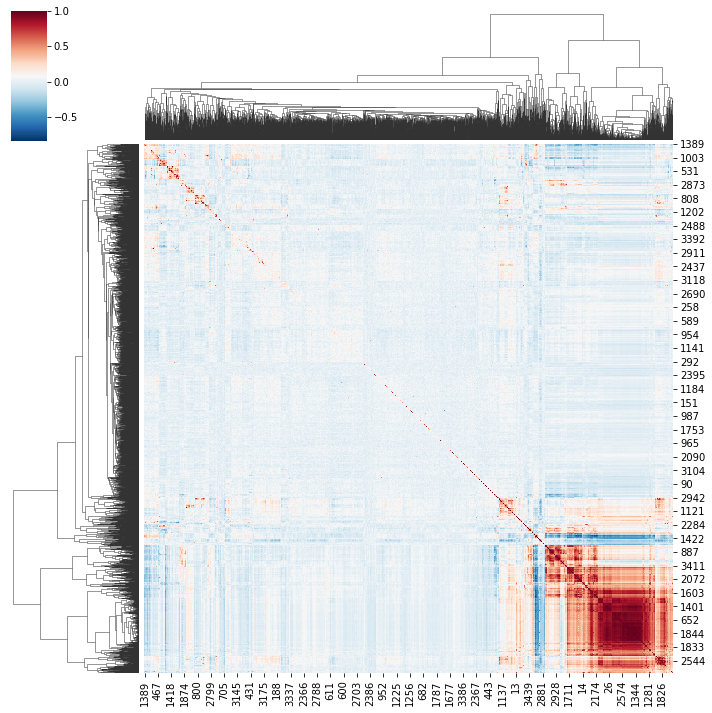

In [107]:
sns.clustermap(cmat,cmap='RdBu_r')

In [108]:
cutoff = 0.5
alldatCons = alldat[alldat.mean(0)[alldat.mean(0)>cutoff].index]

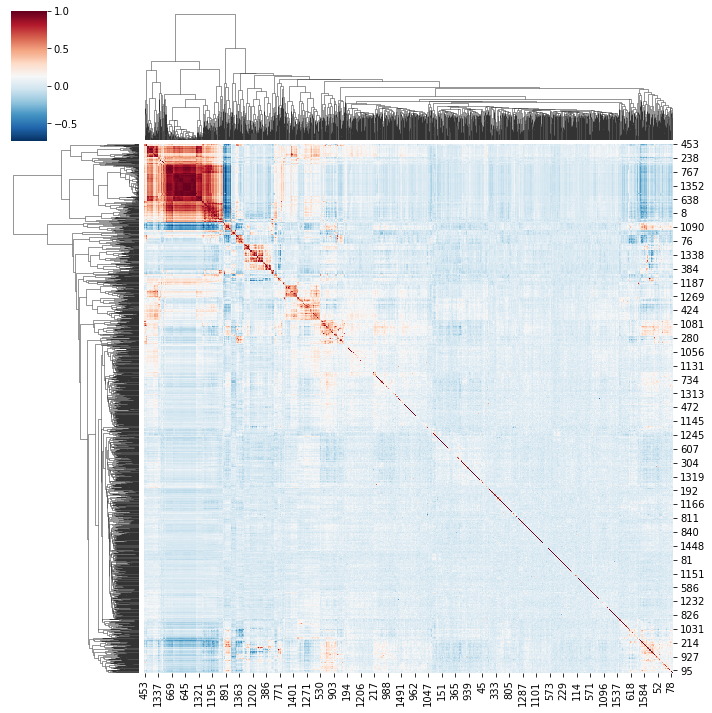

In [110]:
cmat = np.corrcoef(alldatCons.T)
sns.clustermap(cmat,cmap='RdBu_r')

In [289]:
pcamod = PCA(n_components=100, random_state=123).fit(alldat.T)
sum(pcamod.explained_variance_ratio_)

0.9071421670319295

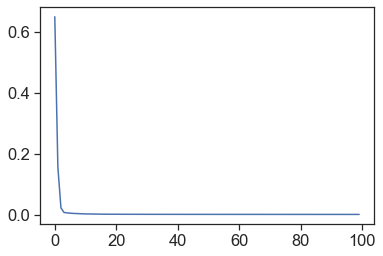

In [290]:
plt.plot(pcamod.explained_variance_ratio_)

In [11]:
alldat = pandas.read_csv('/Users/jacobv/Science/PLS_GXP/PNC/t1_images/GM_at_ABA_coords.csv',
                        index_col=0)
means = alldat.mean()

In [130]:
mni = nib.load('/usr/local/fsl/data/standard/MNI152_T1_1mm.nii.gz')
dat = mni.get_fdata()
ndat = np.zeros_like(dat)
ndat[xyz_coords[:,0],xyz_coords[:,1],xyz_coords[:,2]] = means.values
nimg = nib.Nifti1Image(ndat,mni.affine)

/Users/jacobv/jakepy/lib/python3.7/site-packages/nilearn/plotting/js_plotting_utils.py:85: UserWarning: choosing both vmin and a threshold is not allowed; setting vmin to 0
  warnings.warn('choosing both vmin and a threshold is not allowed; '



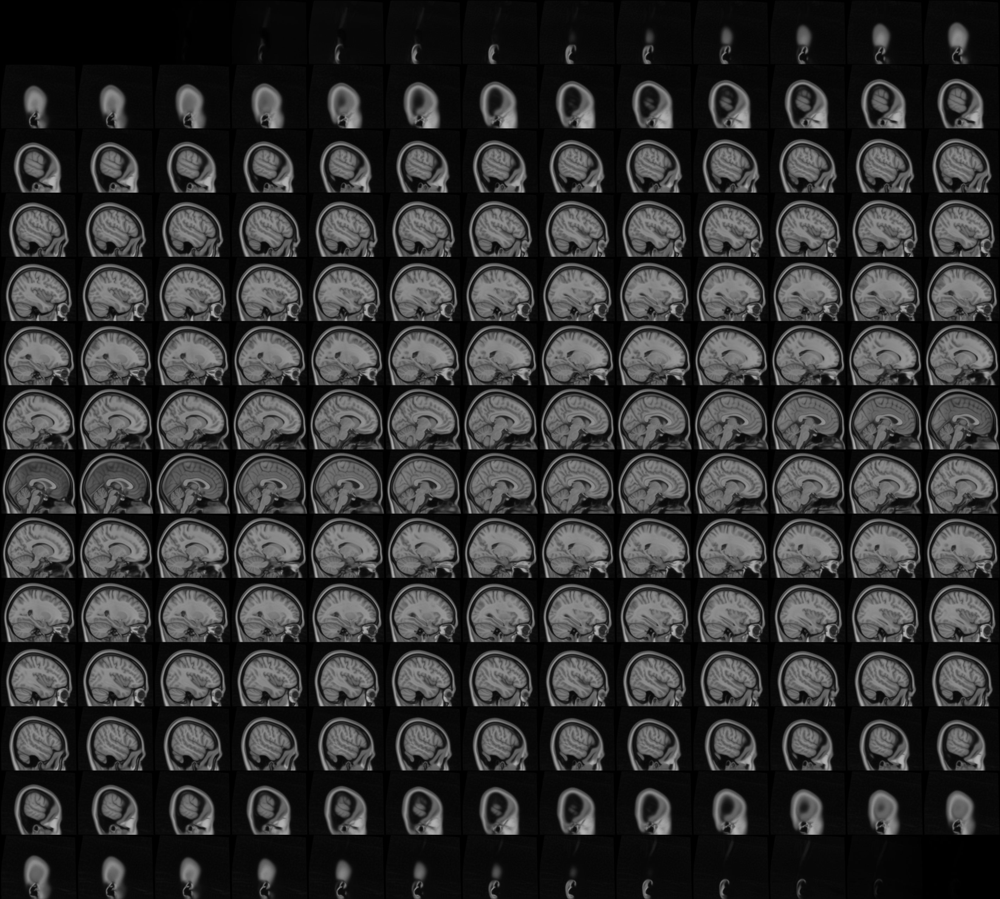
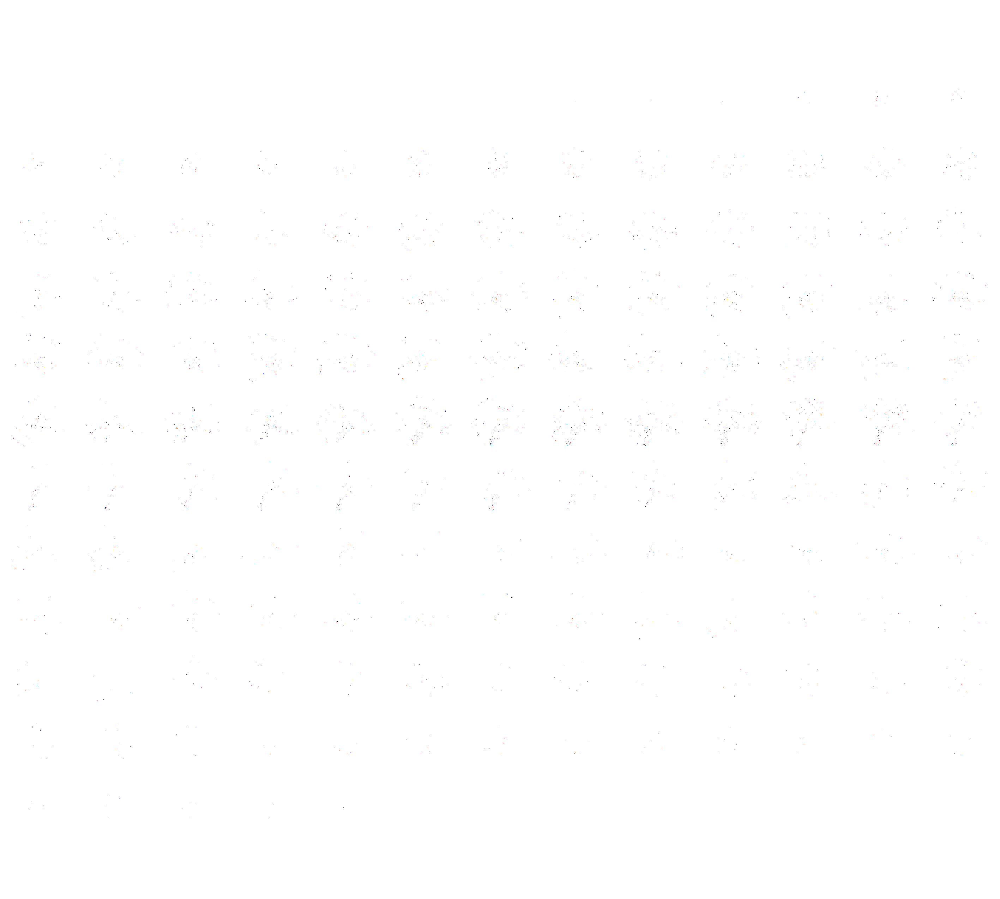

In [137]:
plotting.view_img(nimg,bg_img=mni,vmin=0.001,
                  symmetric_cmap=False,)

thresh = 0.0


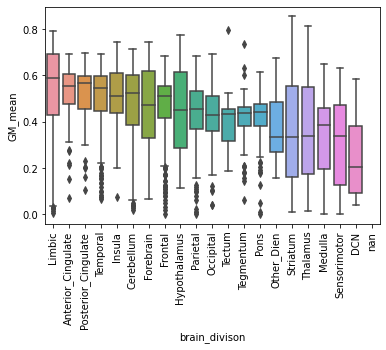

thresh = 0.2


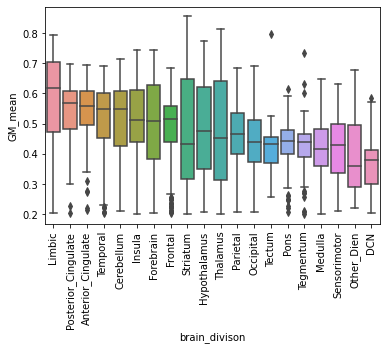

thresh = 0.4


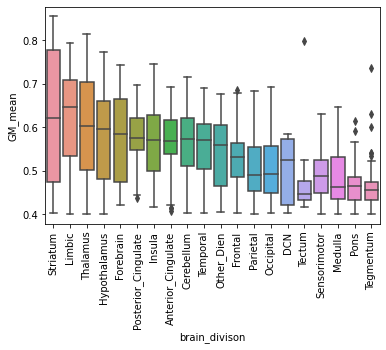

thresh = 0.6000000000000001


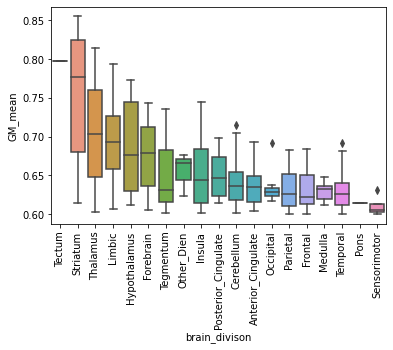

thresh = 0.8


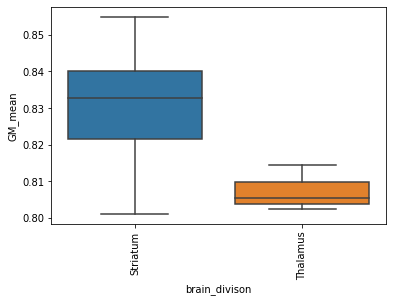

In [12]:
g2=pandas.read_csv('/Users/jacobv/Science/PLS_GXP/txfer/MAIN_gcx_wholebrain_info_W_BRAIN_DIVISIONS.csv',
                  index_col=0)
g2 = g2.loc[cdf[cdf.columns[0]].values]
g2.loc[:,'GM_mean'] = alldat.mean(0).values
for i in range(0,10,2):
    thresh = i*0.1
    print('thresh =',thresh)
    order = g2[g2.GM_mean>thresh].pivot(columns='brain_divison',values='GM_mean'
                                       ).mean().sort_values(ascending=False
                                                           ).index.tolist()
    g = sns.boxplot(x='brain_divison',y='GM_mean',
                    data=g2[g2.GM_mean>thresh],
                   order=order)
    g.set_xticklabels(g.get_xticklabels(),rotation=90)
    plt.show()

In [13]:
alldat = pandas.read_csv('/Users/jacobv/Science/PLS_GXP/PNC/t1_images/GM_at_ABA_coords.csv',
                        index_col=0)
alldat = alldat.loc[shared]
cutoff=0
bad_ind = alldat.mean(0)[alldat.mean(0)<=cutoff].index.tolist()
alldat.drop(bad_ind,inplace=True,axis=1)
g2=pandas.read_csv('/Users/jacobv/Science/PLS_GXP/txfer/MAIN_gcx_wholebrain_info_W_BRAIN_DIVISIONS.csv',
                  index_col=0)
g2 = g2.loc[cdf[cdf.columns[0]].values]
g2.drop(g2.iloc[bad_ind].index,inplace=True)

thresh = 0.0


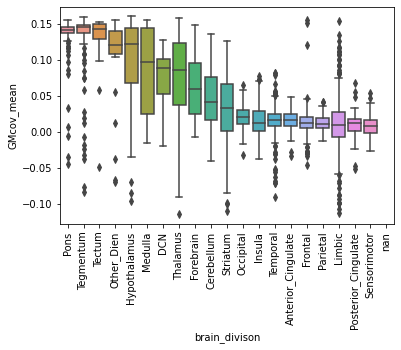

thresh = 0.2


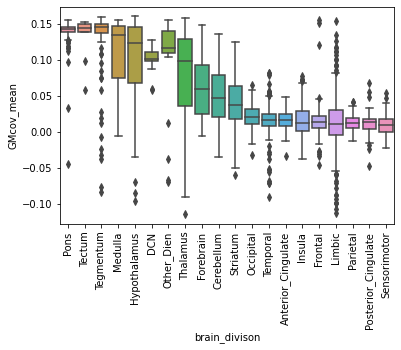

thresh = 0.4


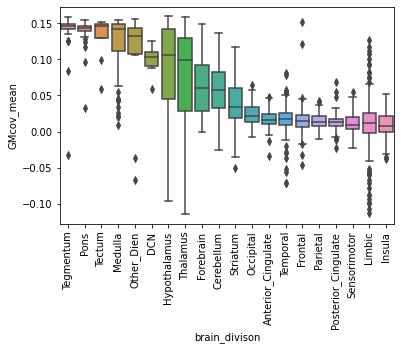

thresh = 0.6000000000000001


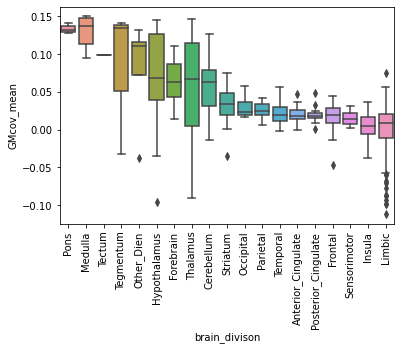

thresh = 0.8


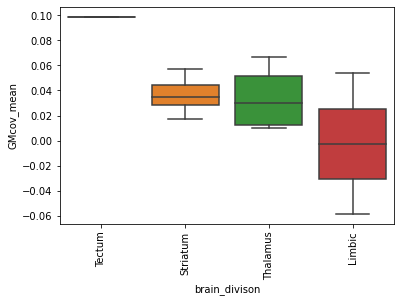

In [199]:
cmat = np.corrcoef(alldat.T)
g2.loc[:,'GMcov_mean'] = cmat.mean(0)
g2.loc[:,'GM_mean'] = alldat.mean(0).values
for i in range(0,10,2):
    thresh = i*0.1
    print('thresh =',thresh)
    order = g2[g2.GM_mean>thresh].pivot(columns='brain_divison',
                                        values='GMcov_mean'
                                       ).mean().sort_values(ascending=False
                                                           ).index.tolist()
    g = sns.boxplot(x='brain_divison',y='GMcov_mean',
                    data=g2[g2.GM_mean>thresh],
                   order=order)
    g.set_xticklabels(g.get_xticklabels(),rotation=90)
    plt.show()

# Pilot PLS

In [200]:
pcamod = PCA(n_components=100, random_state=123).fit(alldat)
print(sum(pcamod.explained_variance_ratio_).round(3))
pcamod.explained_variance_ratio_.round(3)

0.758


array([0.479, 0.065, 0.02 , 0.016, 0.012, 0.01 , 0.009, 0.007, 0.006,
       0.006, 0.005, 0.004, 0.004, 0.004, 0.003, 0.003, 0.003, 0.003,
       0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002,
       0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.001, 0.001,
       0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001,
       0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001,
       0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001,
       0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001,
       0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001,
       0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001,
       0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001,
       0.001])

In [205]:
pcamod = PCA(n_components=100, random_state=123).fit(cmat)
sum(pcamod.explained_variance_ratio_)
print(sum(pcamod.explained_variance_ratio_).round(3))
pcamod.explained_variance_ratio_.round(3)

0.984


array([0.743, 0.104, 0.033, 0.027, 0.015, 0.009, 0.007, 0.005, 0.004,
       0.003, 0.003, 0.002, 0.002, 0.001, 0.001, 0.001, 0.001, 0.001,
       0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.   ,
       0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   ])

In [216]:
g2.loc[~pandas.notnull(g2.brain_divison),'brain_divison'] = 'Posterior_Cingulate'

In [215]:
pca_tfm.dropna().shape

(3465, 100)

In [221]:
pcamod = PCA(n_components=100, random_state=123).fit(cmat)
pca_tfm = pandas.DataFrame(pcamod.transform(cmat))
tr,te = train_test_split(pca_tfm, stratify=g2.brain_divison.values, random_state=123)
tr_y = g2.iloc[tr.index][['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
te_y = g2.iloc[te.index][['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]

In [224]:
from sklearn.cross_decomposition import PLSCanonical, PLSSVD
from sklearn.model_selection import KFold

ncs = 3
nc_chooser = pandas.DataFrame(index = range(ncs*i), columns = ['nc', 'estimator', 'r2','mae'])
i=0
for k,nc in enumerate(range(1,ncs+1)):
    print(nc)
    estimators = {'PLSR': PLSRegression(n_components=nc),}
#    nc_chooser.loc[k*3:k*3+2,'nc'] = [nc]*3
    for lab, estimator in estimators.items():
        for it in range(10):
            cv=KFold(n_splits=10,shuffle=True,random_state=123+it)
            pred = cross_val_predict(estimator, tr, tr_y, 
                                    groups = g2.iloc[tr.index].slab_type, 
                                     cv=cv)
            nc_chooser.loc[i, 'r2'] = r2_score(y_true=tr_y, y_pred=pred)
            nc_chooser.loc[i, 'mae'] = mean_absolute_error(y_true=tr_y, y_pred=pred)
            nc_chooser.loc[i, 'estimator'] = lab
            nc_chooser.loc[i,'nc'] = nc
            nc_chooser.loc[i,'iter'] = it
            i+=1

1
2
3


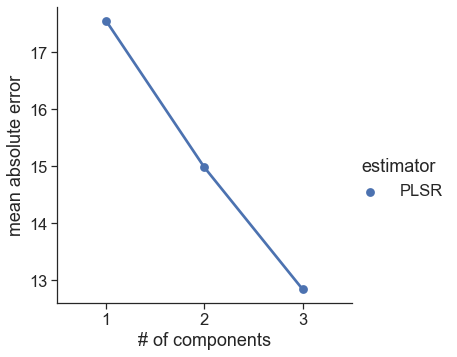

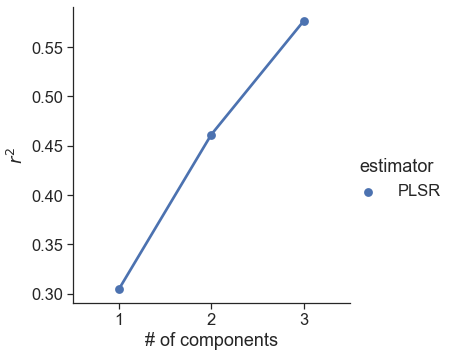

In [225]:
sns.set(font_scale=1.5)
sns.set_style('ticks')

sns.catplot(x = 'nc', y='mae', hue = 'estimator', 
               data=nc_chooser,aspect=1,kind='point')
plt.ylabel('mean absolute error')
plt.xlabel('# of components')
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/estimator_selection_cv_mae_rkf.pdf', 
#             bbox_inches='tight')
plt.show()

sns.catplot(x = 'nc', y='r2', hue = 'estimator', 
               data=nc_chooser[nc_chooser.nc<5],
               aspect=1,kind='point')
plt.ylabel('$r^{2}$')
plt.xlabel('# of components')
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/estimator_selection_cv_r2_rkf.pdf', 
#             bbox_inches='tight')
plt.show()

finished iteration 0
finished iteration 100
finished iteration 200
finished iteration 300
finished iteration 400
finished iteration 500
finished iteration 600
finished iteration 700
finished iteration 800
finished iteration 900


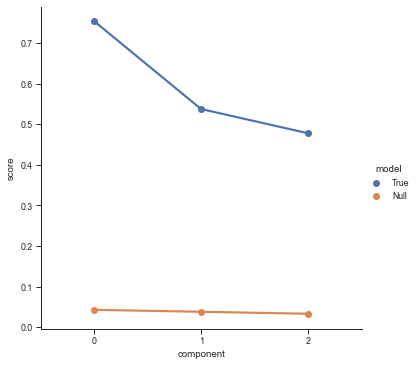

component 0: p = 0.001  ***
component 1: p = 0.001  ***
component 2: p = 0.001  ***


In [227]:
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(tr,tr_y)
results, comp_sig = XD.evaluate_components(pls_mod, tr, tr_y, n_iterations=1000)

In [248]:
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(tr,tr_y)

PLSRegression(n_components=3)

In [228]:
pal=sns.color_palette('nipy_spectral',n_colors=12)
colos = dict(zip(['Y','Z','X'],
                [pal[5],pal[3],pal[-1]]
                ))
pal

[(0.4993470588235294, 0.0, 0.5659960784313726),
 (0.0, 0.0, 0.6784647058823529),
 (0.0, 0.2928313725490196, 0.8667),
 (0.0, 0.6078470588235294, 0.8431705882352941),
 (0.0, 0.6667, 0.575150980392157),
 (0.0, 0.633978431372549, 0.0),
 (0.0, 0.8326960784313726, 0.0),
 (0.2300549019607843, 1.0, 0.0),
 (0.9097705882352941, 0.9411470588235294, 0.0),
 (1.0, 0.7254901960784318, 0.0),
 (1.0, 0.03529411764705881, 0.0),
 (0.8326960784313726, 0.0, 0.0)]

0.574 15.448280324585124


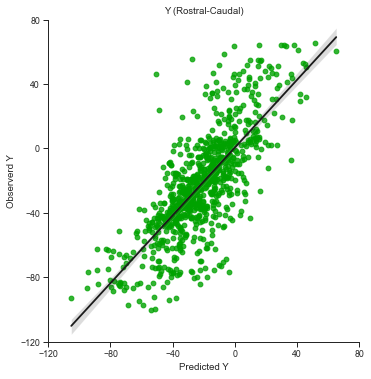

0.65 13.65887094171197


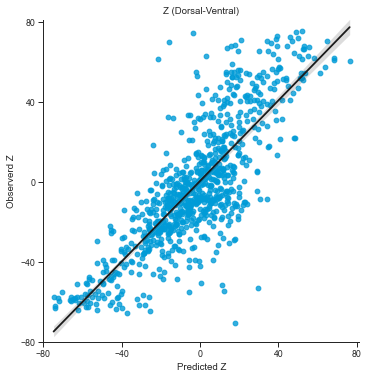

0.412 10.247312295720347


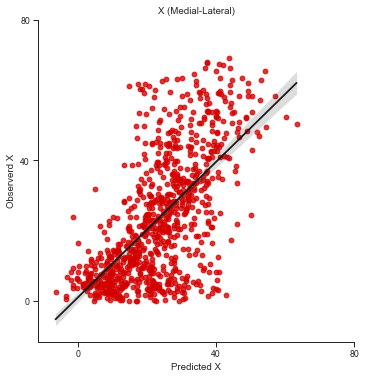

In [249]:
# plot model fit
dims = ['Y','Z','X']
labs = dict(zip(dims,['Rostral-Caudal',
                      'Dorsal-Ventral',
                      'Medial-Lateral']))
te_pred = pls_mod.predict(te)
for i in range(te_y.shape[-1]):
#     fig = plt.figure(figsize=(6,4))
#     ax = fig.add_subplot(111)
    label = te_y.columns[i][-1].upper()
    plotr = pandas.concat([pandas.Series(te_pred[:,i]),
                          pandas.Series(te_y[te_y.columns[i]].values)],
                         axis=1)
    plotr.columns = ['x','y']
    g=sns.lmplot(x='x', y='y',data=plotr,
                 scatter_kws={'color':colos[label]},
                 line_kws={'color':'k'}
                )
    pmax = np.max(plotr.max().values)
    pmin = np.min(plotr.min().values)
    incr = 40
    tmin = int(round((pmin/incr))*incr)
    tmax = int(round((pmax/incr))*incr) + 1
    trange = list(range(tmin,tmax,incr))
    plt.title('%s (%s)'%(label,labs[label]))
    plt.xlabel('Predicted %s'%label)
    plt.ylabel('Observerd %s'%label)
    plt.xlim(pmin-5,pmax+5)
    plt.ylim(pmin-5,pmax+5)
    g.set(xticks=trange,yticks=trange)
    r2 = stats.pearsonr(te_pred[:,i], te_y[te_y.columns[i]])[0]**2
    mae = mean_absolute_error(te_pred[:,i], te_y[te_y.columns[i]])
    print(round(r2,3),mae)
#     plt.text(0.85,0.2,
#              'r$^2$ = %s \nmae=%s'%(round(r2,2),round(mae,1)),
#             transform=ax.transAxes,horizontalalignment='right')
#     plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/TestRes_%s.pdf'%label,
#                bbox_inches='tight')
    plt.show()


In [250]:
pls_mod = PLSRegression(n_components=3)
full_y = g2[['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
pls_mod.fit(pca_tfm, full_y)

PLSRegression(n_components=3)

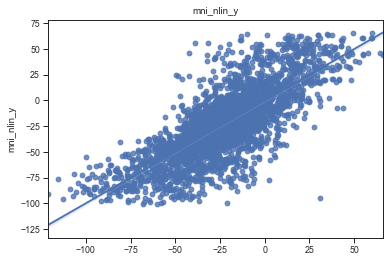

(0.7776575684083536, 0.0)
14.845386647282236


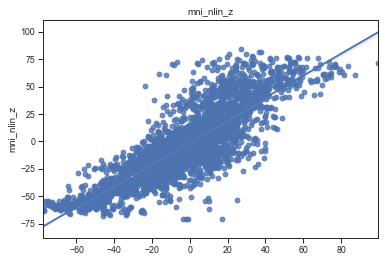

(0.8400113514273663, 0.0)
12.631873603528218


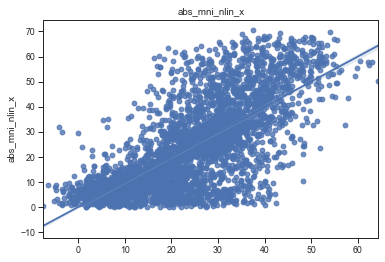

(0.7148361988248902, 0.0)
9.443576306470062


In [251]:
# plot model fit
pred = pls_mod.predict(pca_tfm)
for i in range(full_y.shape[-1]):
    plt.close()
    sns.regplot(x=pred[:,i], y=full_y[full_y.columns[i]])
    plt.title(full_y.columns[i])
    plt.show()
    print(stats.pearsonr(pred[:,i], full_y[full_y.columns[i]]))
    print(mean_absolute_error(pred[:,i], full_y[full_y.columns[i]]))

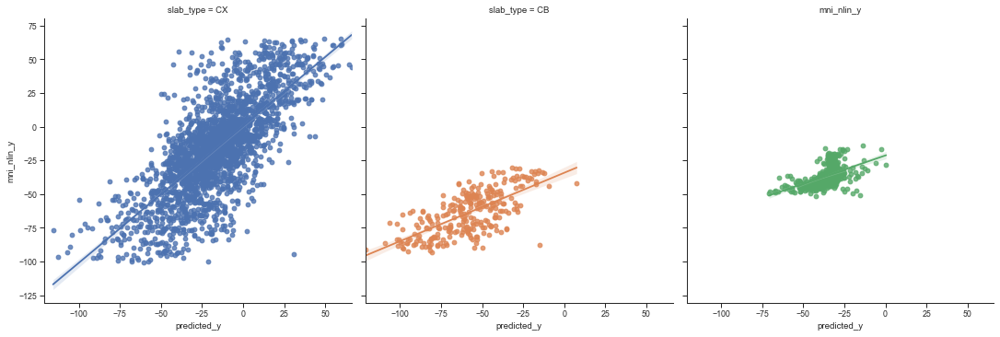

CX r2 =0.5369447371294046
CX mae =45.45753002885348
CB r2 =0.4675123131629365
CB mae =77.18220720832618
BS r2 =0.2861981289588257
BS mae =44.239074216211094


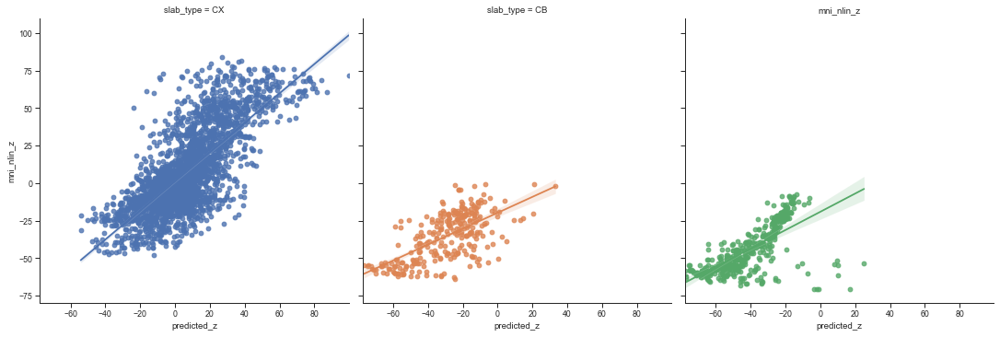

CX r2 =0.5624280070914499
CX mae =36.10121970208535
CB r2 =0.41131194507772145
CB mae =35.85702299072735
BS r2 =0.46161105124106566
BS mae =11.207835445006383


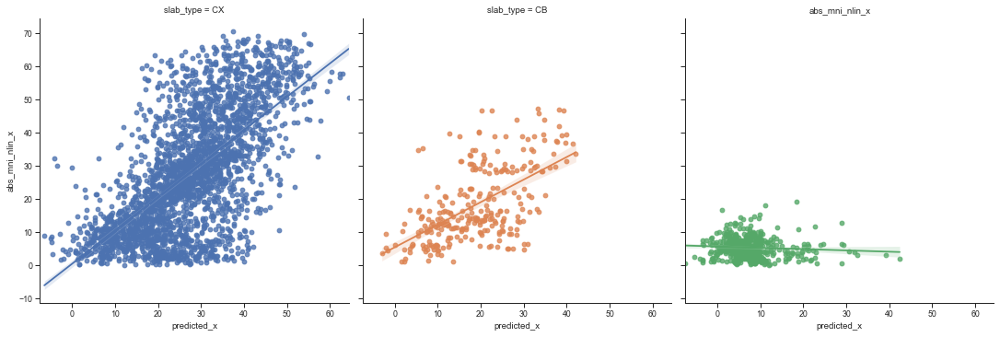

CX r2 =0.42926047306997345
CX mae =30.192044279262664
CB r2 =0.34773776021162744
CB mae =54.172438474359865
BS r2 =0.006170007761770346
BS mae =50.98478279329065


In [254]:
# plot fit by slab type
preds_df = pandas.concat([pandas.DataFrame(pred, index=full_y.index), full_y],axis=1)
preds_df.columns = ['predicted_y', 'predicted_z', 'predicted_x'] + full_y.columns.tolist()
preds_df.loc[:,'slab_type'] = g2.iloc[pca_tfm.index]['slab_type']
n_components = full_y.shape[-1]
for i in range(n_components):
    plt.close()
    sns.lmplot(x=preds_df.columns[i], y = preds_df.columns[i+n_components], 
               col = 'slab_type', data = preds_df, hue='slab_type')
    plt.title(preds_df.columns[i+n_components])
    plt.show()
    for slab in preds_df.slab_type.unique():
        r2 = stats.pearsonr(preds_df[preds_df.slab_type==slab][preds_df.columns[i]],
                           preds_df[preds_df.slab_type==slab][preds_df.columns[i+n_components]]
                           )[0]**2
        mae = mean_absolute_error(preds_df[preds_df.slab_type==slab
                                          ][preds_df.columns[i]],
                                  preds_df[preds_df.slab_type==slab
                                          ][preds_df.columns[i+2]])
        print('%s r2 =%s'%(slab,r2))
        print('%s mae =%s'%(slab,mae))

/Users/jacobv/jakepy/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(-115.0, 75.0)

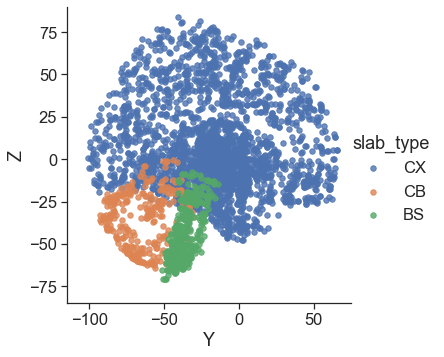

In [255]:
sns.set_context('notebook',font_scale=1.5)
sns.lmplot('mni_nlin_y', 'mni_nlin_z', hue = 'slab_type', data=g2, fit_reg=False, 
           scatter_kws={"s": 30})
plt.xlabel('Y')
plt.ylabel('Z')
plt.ylim(-85,90)
plt.xlim(-115,75)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain_plot_YZ.pdf',
#            bbox_inches='tight')

(-115.0, 75.0)

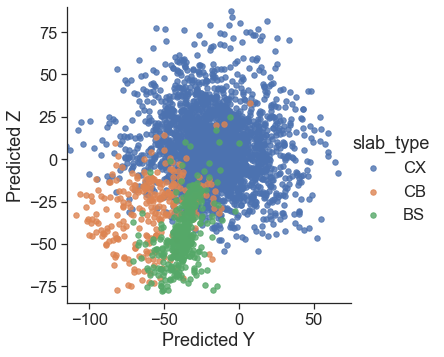

In [256]:
sns.lmplot(x='predicted_y', y='predicted_z', hue = 'slab_type', 
           data=preds_df, 
           fit_reg=False, scatter_kws={"s": 30})
plt.xlabel('Predicted Y')
plt.ylabel('Predicted Z')
plt.ylim(-85,90)
plt.xlim(-115,75)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain_plot_YZ_pred.pdf',
#            bbox_inches='tight')

In [257]:
bd2 = ['Temporal' if x == 'Limbic' else\
      'Subcortex' if x in ['Thalamus','Striatum',
                           'Hypothalamus','Forebrain',
                           'Other_Dien'] else\
      'Brainstem' if x in ['Medulla','Pons',
                           'Tegmentum','Tectum'] else\
      'Frontal' if x in ['Anterior_Cingulate','Insula'] else\
      'Parietal' if x == 'Posterior_Cingulate' else\
      'Cerebellum' if x == 'DCN' else\
      x for x in g2.brain_divison.values]
g2.loc[:,'BD2'] = bd2
preds_df.loc[:,'BD2'] = bd2

(-115.0, 75.0)

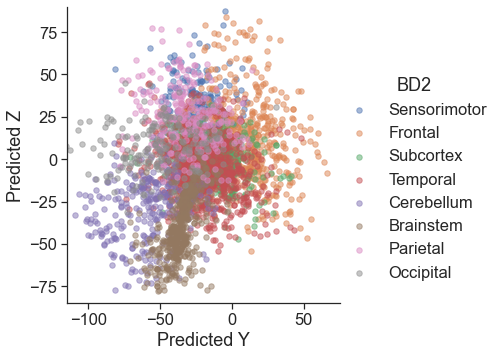

In [258]:
sns.lmplot(x='predicted_y', y='predicted_z', hue = 'BD2', data=preds_df, 
           fit_reg=False, 
           scatter_kws={"s": 30,'alpha':0.5})
plt.xlabel('Predicted Y')
plt.ylabel('Predicted Z')
plt.ylim(-85,90)
plt.xlim(-115,75)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain_plot_YZ_pred_div.pdf',
#            bbox_inches='tight')

In [259]:
# is extremity or distance from center related to error?

# extremity
from scipy.spatial.distance import cdist
distmat = cdist(full_y.round(4).values,full_y.round(4).values)
dm = pandas.DataFrame(distmat)

preds_df.loc[:,'extremity'] = dm.mean(1).values

# distance from center
preds_df.loc[:,'abs_mni_nlin_y'] = preds_df.mni_nlin_y.abs().values
preds_df.loc[:,'abs_mni_nlin_z'] = preds_df.mni_nlin_z.abs().values
preds_df.loc[:,'center_dist'] = preds_df[['abs_mni_nlin_x','abs_mni_nlin_y',
                               'abs_mni_nlin_z']].mean(1).values

In [261]:
preds_df.loc[:,'error_y'] = abs(preds_df.predicted_y.values -\
                                preds_df.mni_nlin_y.values)
preds_df.loc[:,'error_z'] = abs(preds_df.predicted_z.values -\
                                preds_df.mni_nlin_z.values)
preds_df.loc[:,'error_x'] = abs(preds_df.predicted_x.values -\
                                preds_df.abs_mni_nlin_x.values)
preds_df.loc[:,'total_error'] = preds_df[['error_y',
                                          'error_z',
                                          'error_x']].mean(1).values

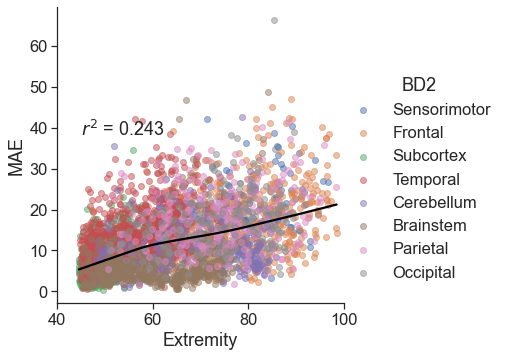

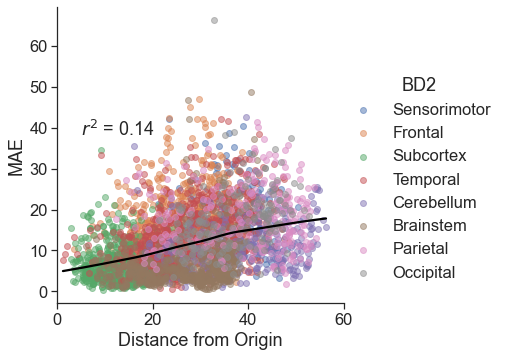

In [262]:
r2 = stats.pearsonr(preds_df.extremity,preds_df.total_error)[0]**2
sns.lmplot(x='extremity',y='total_error',data=preds_df,
          fit_reg=False,hue='BD2',scatter_kws={'alpha':0.5})
sns.regplot(x='extremity',y='total_error',data=preds_df,
          color='black',marker='',lowess=True)
plt.xlabel('Extremity')
plt.ylabel('MAE')
plt.xlim(40,100)
plt.text(45,38,'$r^{2}$ = %s'%round(r2,3))
# plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/ErrVExtremity.pdf',
#            bbox_inches='tight')
plt.show()

r2 = stats.pearsonr(preds_df.center_dist,preds_df.total_error)[0]**2
sns.lmplot(x='center_dist',y='total_error',data=preds_df, 
          fit_reg=False,hue='BD2',scatter_kws={'alpha':0.5})
sns.regplot(x='center_dist',y='total_error',data=preds_df,
         lowess=True,color='black',marker='')
plt.xlabel('Distance from Origin')
plt.ylabel('MAE')
plt.xlim(0,60)
plt.text(5,38,'$r^{2}$ = %s'%round(r2,3))
# plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/ErrVCenterDist.pdf',
#            bbox_inches='tight')
plt.show()

# sns.lmplot(x='abs_mni_nlin_x',y='error_x',data=preds_df, 
#           fit_reg=False,hue='BD2',scatter_kws={'alpha':0.5})
# sns.regplot(x='abs_mni_nlin_x',y='error_x',data=preds_df,
#           lowess=True,color='black',marker='')
# plt.show()

# sns.lmplot(x='abs_mni_nlin_y',y='error_y',data=preds_df, 
#           fit_reg=False,hue='BD2',scatter_kws={'alpha':0.5})
# sns.regplot(x='abs_mni_nlin_y',y='error_y',data=preds_df,
#           lowess=True,color='black',marker='')
# plt.show()

# sns.lmplot(x='abs_mni_nlin_z',y='error_z',data=preds_df, 
#           fit_reg=False,hue='BD2',scatter_kws={'alpha':0.5})
# sns.regplot(x='abs_mni_nlin_z',y='error_z',data=preds_df,
#           lowess=True,color='black',marker='')
# plt.show()

In [265]:
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(pca_tfm, full_y)
y_input = pandas.DataFrame(full_y.values)
bsrx, bsry, allx_bs, ally_bs = XD.bootstrap_features(PLSRegression(n_components=3), 
                                                  pls_mod, 
                                                  pca_tfm, 
                                                  y_input, 
                                                  n_iterations=1000)

finished iteration 0
finished iteration 100
finished iteration 200
finished iteration 300
finished iteration 400
finished iteration 500
finished iteration 600
finished iteration 700
finished iteration 800
finished iteration 900


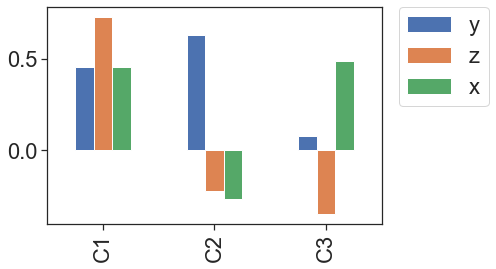

In [266]:
sns.set_context('notebook',font_scale=2)
g = pandas.DataFrame(pls_mod.y_weights_, 
                 index=['y','z','x'],
                 columns=['component %s'%x for x in range(3)]).T.plot.bar()
g.set_xticklabels(['C1','C2','C3'])
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/y_weights.pdf',
#             bbox_inches='tight')

[Text(0, 0, ''),
 Text(1, 0, ''),
 Text(2, 0, ''),
 Text(3, 0, ''),
 Text(4, 0, ''),
 Text(5, 0, ''),
 Text(6, 0, ''),
 Text(7, 0, ''),
 Text(8, 0, ''),
 Text(9, 0, ''),
 Text(10, 0, ''),
 Text(11, 0, ''),
 Text(12, 0, ''),
 Text(13, 0, ''),
 Text(14, 0, ''),
 Text(15, 0, ''),
 Text(16, 0, ''),
 Text(17, 0, ''),
 Text(18, 0, ''),
 Text(19, 0, ''),
 Text(20, 0, ''),
 Text(21, 0, ''),
 Text(22, 0, ''),
 Text(23, 0, ''),
 Text(24, 0, ''),
 Text(25, 0, ''),
 Text(26, 0, ''),
 Text(27, 0, ''),
 Text(28, 0, ''),
 Text(29, 0, ''),
 Text(30, 0, ''),
 Text(31, 0, ''),
 Text(32, 0, ''),
 Text(33, 0, ''),
 Text(34, 0, ''),
 Text(35, 0, ''),
 Text(36, 0, ''),
 Text(37, 0, ''),
 Text(38, 0, ''),
 Text(39, 0, ''),
 Text(40, 0, ''),
 Text(41, 0, ''),
 Text(42, 0, ''),
 Text(43, 0, ''),
 Text(44, 0, ''),
 Text(45, 0, ''),
 Text(46, 0, ''),
 Text(47, 0, ''),
 Text(48, 0, ''),
 Text(49, 0, ''),
 Text(50, 0, ''),
 Text(51, 0, ''),
 Text(52, 0, ''),
 Text(53, 0, ''),
 Text(54, 0, ''),
 Text(55, 0, ''),
 T

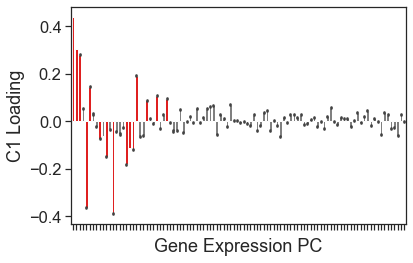

In [269]:
plotr = pandas.concat([pandas.Series(allx_bs[0].values.flatten()),
                       #pandas.Series(list(range(100))*500)],
                       pandas.Series(list(range(100))*1000)],
                      axis=1)
plotr.columns = ['Loading','Component']

sns.set(font_scale=1.5)
sns.set_style('ticks')
colors = ['Red' if x else 'Grey' for x in multipletests(bsrx['p'].loc[0], method='fdr_bh')[0]]
g=sns.barplot(x='Component', y='Loading', data=plotr, palette=colors)
plt.xlabel('Gene Expression PC')
plt.ylabel('C1 Loading')
g.set_xticklabels([None for x in range(100)])

In [ ]:
# sigs = multipletests(bsrx['p'].loc[0], method='fdr_bh')[0]
# new_loading = [pls_mod.x_loadings_[x,0] if sigs[x] else 0 for x in range(pca_tfm.shape[-1])]
# newc1 = np.dot(pcamod.components_.T, new_loading)
# newc1 = pandas.concat([pandas.Series(newc1), pandas.Series(bigdf.columns)],
#                       axis=1)

# Projection

In [270]:
g2.columns

Index(['Unnamed: 0.1', 'donor', 'sample', 'structure_id', 'slab_num',
       'well_id', 'slab_type', 'structure_acronym', 'structure_name',
       'polygon_id', 'mri_voxel_x', 'mri_voxel_y', 'mri_voxel_z', 'mni_x',
       'mni_y', 'mni_z', 'A-P_axis_gxp_signature_similarity_SPCR',
       'A-P_axis_gxp_signature_similarity_LARS',
       'a20_LARS_avg_gene_expression', 'a20_SPCR_avg_gene_expression',
       'a500_SPCR_avg_gene_expression', 'mixed_test_a20_avg_gene_expression',
       'mixed_test_p20_avg_gene_expression', 'p20_LARS_avg_gene_expression',
       'p20_SPCR_avg_gene_expression', 'p500_SPCR_avg_gene_expression',
       'p50_SPCR_avg_gene_expression', 'gabe_label', 'mni_nlin_x',
       'mni_nlin_y', 'mni_nlin_z', 'new_structure_acronym', 'abs_mni_nlin_x',
       'brain_divison', 'Neural_Tube_segment', 'Sensory_Type', 'Cortical_Type',
       'Component1_Expresion', 'Component2_Expresion', 'Component3_Expresion',
       'bilateral_structure_name', 'GMcov_mean', 'GM_mean', 'BD2'],

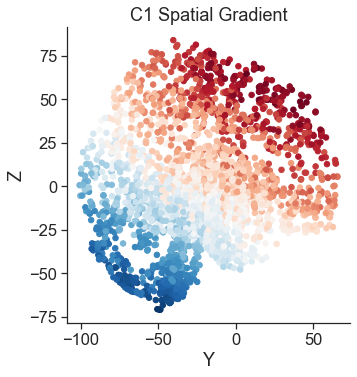

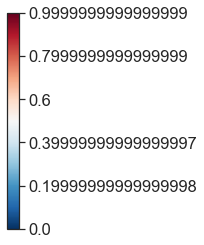

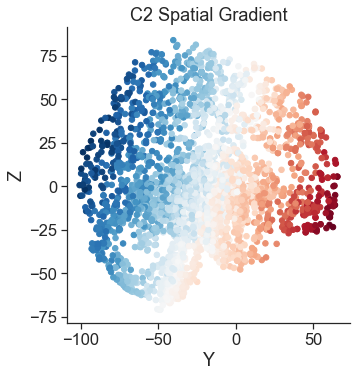

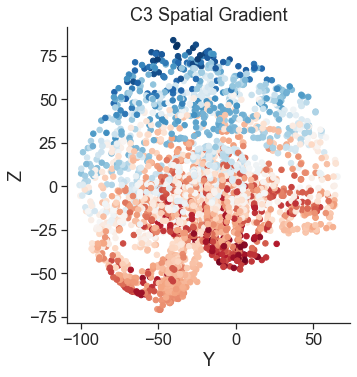

In [273]:
from sklearn.preprocessing import MinMaxScaler
from matplotlib.colors import Normalize

cmap = sns.color_palette('RdBu_r',as_cmap=True)

for i in range(pls_mod.y_weights_.shape[0]):
    #sg = np.dot(full_y.values,pls_mod.y_weights_[i,:])
    sg = np.dot(full_y.values,pls_mod.y_weights_[:,i])
    scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
    g2.loc[:,'C%s_SmoothGradient'%(i+1)] = sg
    norm = Normalize(vmin=np.min(scaled_sg), 
                                       vmax=np.max(scaled_sg))
    cscale = cmap(norm(scaled_sg))

    g = sns.lmplot(x='mni_nlin_y', y='mni_nlin_z',  
                   data=g2, fit_reg=False, #aspect=2,
                   scatter_kws={"s": 30,'color':cscale},
                  palette='RdBu_r')
    
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.title('C%s Spatial Gradient'%(i+1))
    #plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
#     plt.ylim(-85,90)
#     plt.xlim(-115,75)
#     plt.xticks([-100,-50,0,50])
#     plt.yticks(list(range(-75,76,25)))
#     plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/brain_plot_SpatialC%s_YZ.pdf'%(i+1),
#                bbox_inches='tight')

    if i == 0:
    # colorbar
        a = np.array([[0,1]])
        #a = np.linspace(0,1,10)
        plt.figure(figsize=(.2, 5))
        img = plt.imshow(a, cmap="RdBu_r")
        plt.gca().set_visible(False)
        cax = plt.axes([0.1, 0.2, 0.8, 0.6])
        cbar = plt.colorbar(orientation="vertical", cax=cax)
        #newticks = [int(round(norm.inverse(x))) for x in cbar.get_ticks()]
        newticks = [norm.inverse(x) for x in cbar.get_ticks()]
        cbar.set_ticks(cbar.get_ticks())
        cbar.set_ticklabels(newticks)
#         plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/brain_plot_component_cbar.pdf',
#                    bbox_inches='tight')

        plt.show()




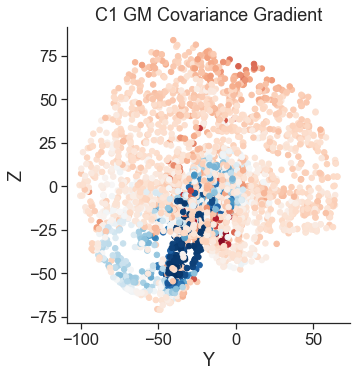

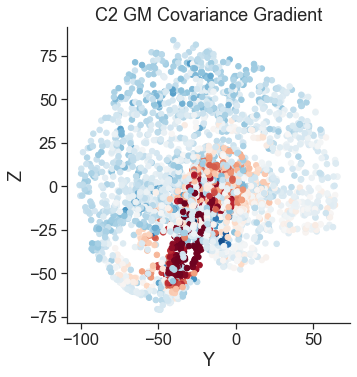

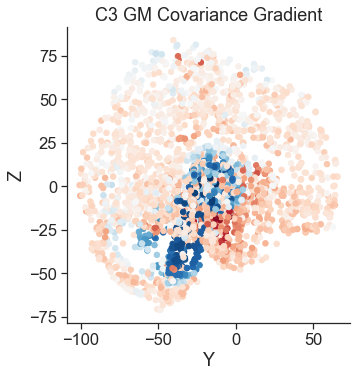

In [276]:
from sklearn.preprocessing import MinMaxScaler

cmap = sns.color_palette('RdBu_r',as_cmap=True)

for i in range(pls_mod.y_weights_.shape[0]):
    #if i == 2:
    sg = np.dot(pca_tfm.values,pls_mod.x_weights_[:,i])
    #else:
    #    sg = -gdf.loc[:,'Component%s_Expresion'%(i+1)].values
    scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
    norm = Normalize(vmin=np.min(scaled_sg), 
                                       vmax=np.max(scaled_sg))
    cscale = cmap(norm(scaled_sg))

    g = sns.lmplot(x='mni_nlin_y', y='mni_nlin_z',# aspect=2, 
                   data=g2, fit_reg=False, 
                   scatter_kws={"s": 30,'color':cscale},
                  palette='RdBu_r')
    
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.title('C%s GM Covariance Gradient'%(i+1))
    #plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
#     plt.ylim(-85,90)
#     plt.xlim(-115,75)
#     plt.xticks([-100,-50,0,50])
#     plt.yticks(list(range(-75,76,25)))
#     plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/brain_plot_GenomicC%s_YZ.pdf'%(i+1),
#                bbox_inches='tight')



<AxesSubplot:>

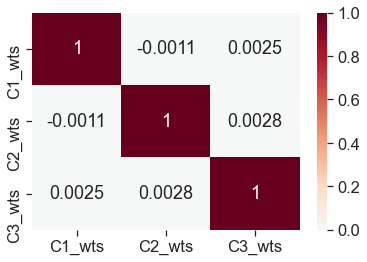

In [283]:
wmat = pandas.DataFrame(np.corrcoef(pls_mod.x_weights_.T),
                       index=['C1_wts','C2_wts','C3_wts'],
                       columns=['C1_wts','C2_wts','C3_wts'])
sns.heatmap(wmat,cmap='RdBu_r',center=0,annot=True)

# Redo it on Sub X GM instead of GM x GM

In [291]:
pcamod = PCA(n_components=100, random_state=123).fit(alldat.T)
pca_tfm = pandas.DataFrame(pcamod.transform(alldat.T))
tr,te = train_test_split(pca_tfm, stratify=g2.brain_divison.values, random_state=123)
tr_y = g2.iloc[tr.index][['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
te_y = g2.iloc[te.index][['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]

In [288]:
pca_tfm.shape

(3465, 100)

In [292]:
from sklearn.cross_decomposition import PLSCanonical, PLSSVD
from sklearn.model_selection import KFold

ncs = 3
nc_chooser = pandas.DataFrame(index = range(ncs*i), columns = ['nc', 'estimator', 'r2','mae'])
i=0
for k,nc in enumerate(range(1,ncs+1)):
    print(nc)
    estimators = {'PLSR': PLSRegression(n_components=nc),}
#    nc_chooser.loc[k*3:k*3+2,'nc'] = [nc]*3
    for lab, estimator in estimators.items():
        for it in range(10):
            cv=KFold(n_splits=10,shuffle=True,random_state=123+it)
            pred = cross_val_predict(estimator, tr, tr_y, 
                                    groups = g2.iloc[tr.index].slab_type, 
                                     cv=cv)
            nc_chooser.loc[i, 'r2'] = r2_score(y_true=tr_y, y_pred=pred)
            nc_chooser.loc[i, 'mae'] = mean_absolute_error(y_true=tr_y, y_pred=pred)
            nc_chooser.loc[i, 'estimator'] = lab
            nc_chooser.loc[i,'nc'] = nc
            nc_chooser.loc[i,'iter'] = it
            i+=1

1
2
3


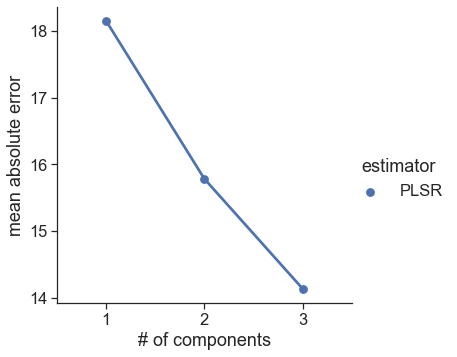

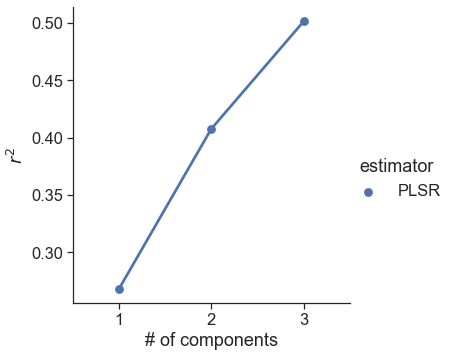

In [293]:
sns.set(font_scale=1.5)
sns.set_style('ticks')

sns.catplot(x = 'nc', y='mae', hue = 'estimator', 
               data=nc_chooser,aspect=1,kind='point')
plt.ylabel('mean absolute error')
plt.xlabel('# of components')
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/estimator_selection_cv_mae_rkf.pdf', 
#             bbox_inches='tight')
plt.show()

sns.catplot(x = 'nc', y='r2', hue = 'estimator', 
               data=nc_chooser[nc_chooser.nc<5],
               aspect=1,kind='point')
plt.ylabel('$r^{2}$')
plt.xlabel('# of components')
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/estimator_selection_cv_r2_rkf.pdf', 
#             bbox_inches='tight')
plt.show()

finished iteration 0
finished iteration 100
finished iteration 200
finished iteration 300
finished iteration 400
finished iteration 500
finished iteration 600
finished iteration 700
finished iteration 800
finished iteration 900


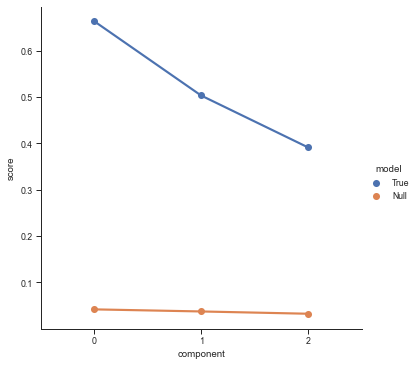

component 0: p = 0.001  ***
component 1: p = 0.001  ***
component 2: p = 0.001  ***


In [294]:
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(tr,tr_y)
results, comp_sig = XD.evaluate_components(pls_mod, tr, tr_y, n_iterations=1000)

In [295]:
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(tr,tr_y)

PLSRegression(n_components=3)

In [296]:
pal=sns.color_palette('nipy_spectral',n_colors=12)
colos = dict(zip(['Y','Z','X'],
                [pal[5],pal[3],pal[-1]]
                ))
pal

[(0.4993470588235294, 0.0, 0.5659960784313726),
 (0.0, 0.0, 0.6784647058823529),
 (0.0, 0.2928313725490196, 0.8667),
 (0.0, 0.6078470588235294, 0.8431705882352941),
 (0.0, 0.6667, 0.575150980392157),
 (0.0, 0.633978431372549, 0.0),
 (0.0, 0.8326960784313726, 0.0),
 (0.2300549019607843, 1.0, 0.0),
 (0.9097705882352941, 0.9411470588235294, 0.0),
 (1.0, 0.7254901960784318, 0.0),
 (1.0, 0.03529411764705881, 0.0),
 (0.8326960784313726, 0.0, 0.0)]

0.545 16.005855477658045


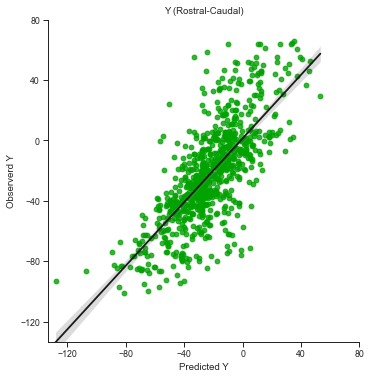

0.549 15.289274425511008


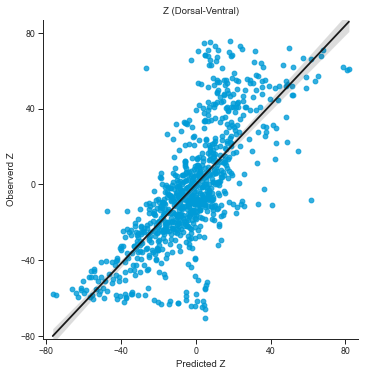

0.391 10.69148126789124


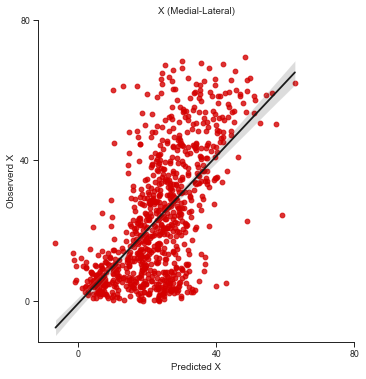

In [297]:
# plot model fit
dims = ['Y','Z','X']
labs = dict(zip(dims,['Rostral-Caudal',
                      'Dorsal-Ventral',
                      'Medial-Lateral']))
te_pred = pls_mod.predict(te)
for i in range(te_y.shape[-1]):
#     fig = plt.figure(figsize=(6,4))
#     ax = fig.add_subplot(111)
    label = te_y.columns[i][-1].upper()
    plotr = pandas.concat([pandas.Series(te_pred[:,i]),
                          pandas.Series(te_y[te_y.columns[i]].values)],
                         axis=1)
    plotr.columns = ['x','y']
    g=sns.lmplot(x='x', y='y',data=plotr,
                 scatter_kws={'color':colos[label]},
                 line_kws={'color':'k'}
                )
    pmax = np.max(plotr.max().values)
    pmin = np.min(plotr.min().values)
    incr = 40
    tmin = int(round((pmin/incr))*incr)
    tmax = int(round((pmax/incr))*incr) + 1
    trange = list(range(tmin,tmax,incr))
    plt.title('%s (%s)'%(label,labs[label]))
    plt.xlabel('Predicted %s'%label)
    plt.ylabel('Observerd %s'%label)
    plt.xlim(pmin-5,pmax+5)
    plt.ylim(pmin-5,pmax+5)
    g.set(xticks=trange,yticks=trange)
    r2 = stats.pearsonr(te_pred[:,i], te_y[te_y.columns[i]])[0]**2
    mae = mean_absolute_error(te_pred[:,i], te_y[te_y.columns[i]])
    print(round(r2,3),mae)
#     plt.text(0.85,0.2,
#              'r$^2$ = %s \nmae=%s'%(round(r2,2),round(mae,1)),
#             transform=ax.transAxes,horizontalalignment='right')
#     plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/TestRes_%s.pdf'%label,
#                bbox_inches='tight')
    plt.show()


In [298]:
pls_mod = PLSRegression(n_components=3)
full_y = g2[['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
pls_mod.fit(pca_tfm, full_y)

PLSRegression(n_components=3)

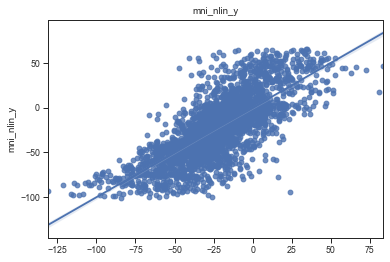

(0.7534735256263463, 0.0)
15.857085741456512


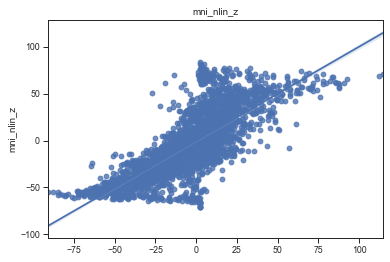

(0.7718912319562484, 0.0)
14.38575333206146


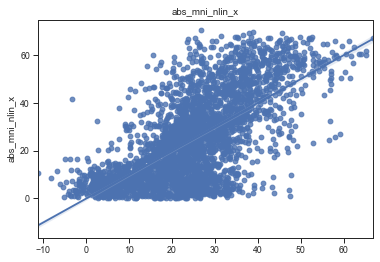

(0.6763391734997409, 0.0)
10.21791140015924


In [299]:
# plot model fit
pred = pls_mod.predict(pca_tfm)
for i in range(full_y.shape[-1]):
    plt.close()
    sns.regplot(x=pred[:,i], y=full_y[full_y.columns[i]])
    plt.title(full_y.columns[i])
    plt.show()
    print(stats.pearsonr(pred[:,i], full_y[full_y.columns[i]]))
    print(mean_absolute_error(pred[:,i], full_y[full_y.columns[i]]))

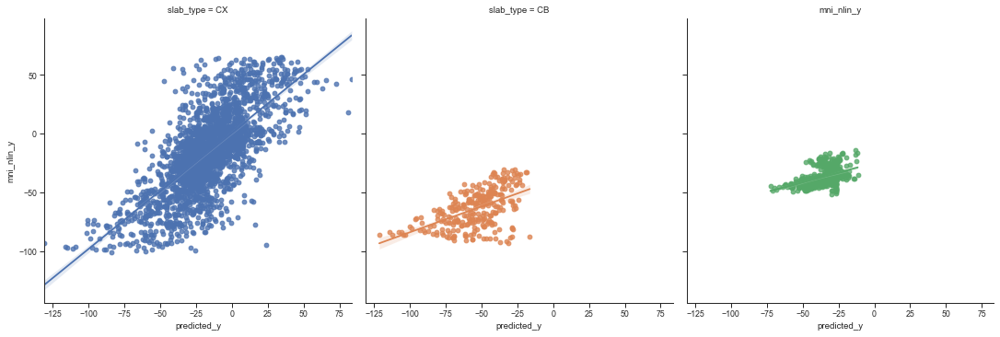

CX r2 =0.5061999704735262
CX mae =45.456920921209786
CB r2 =0.2793192879316684
CB mae =72.46782130894822
BS r2 =0.22234982641835283
BS mae =44.74867705379564


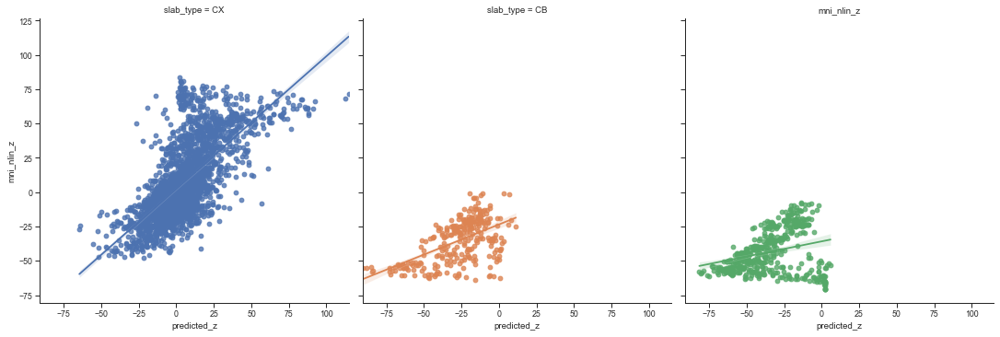

CX r2 =0.4752146598404757
CX mae =34.582293654803465
CB r2 =0.30137614460761153
CB mae =38.32393305069643
BS r2 =0.07744156093326537
BS mae =15.270705924146462


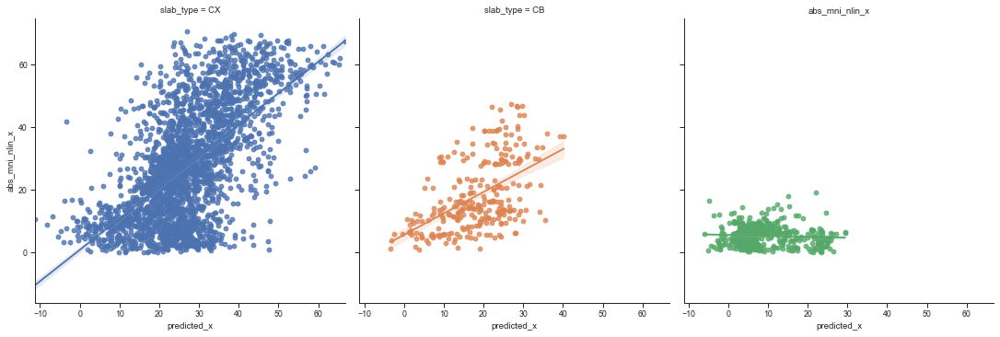

CX r2 =0.3774878142306636
CX mae =29.903794171418358
CB r2 =0.26717796968513124
CB mae =53.74001266657076
BS r2 =0.004873111343643245
BS mae =52.41138107035026


In [300]:
# plot fit by slab type
preds_df = pandas.concat([pandas.DataFrame(pred, index=full_y.index), full_y],axis=1)
preds_df.columns = ['predicted_y', 'predicted_z', 'predicted_x'] + full_y.columns.tolist()
preds_df.loc[:,'slab_type'] = g2.iloc[pca_tfm.index]['slab_type']
n_components = full_y.shape[-1]
for i in range(n_components):
    plt.close()
    sns.lmplot(x=preds_df.columns[i], y = preds_df.columns[i+n_components], 
               col = 'slab_type', data = preds_df, hue='slab_type')
    plt.title(preds_df.columns[i+n_components])
    plt.show()
    for slab in preds_df.slab_type.unique():
        r2 = stats.pearsonr(preds_df[preds_df.slab_type==slab][preds_df.columns[i]],
                           preds_df[preds_df.slab_type==slab][preds_df.columns[i+n_components]]
                           )[0]**2
        mae = mean_absolute_error(preds_df[preds_df.slab_type==slab
                                          ][preds_df.columns[i]],
                                  preds_df[preds_df.slab_type==slab
                                          ][preds_df.columns[i+2]])
        print('%s r2 =%s'%(slab,r2))
        print('%s mae =%s'%(slab,mae))

/Users/jacobv/jakepy/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(-115.0, 75.0)

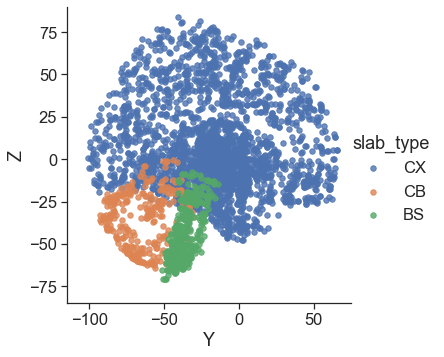

In [301]:
sns.set_context('notebook',font_scale=1.5)
sns.lmplot('mni_nlin_y', 'mni_nlin_z', hue = 'slab_type', data=g2, fit_reg=False, 
           scatter_kws={"s": 30})
plt.xlabel('Y')
plt.ylabel('Z')
plt.ylim(-85,90)
plt.xlim(-115,75)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain_plot_YZ.pdf',
#            bbox_inches='tight')

(-115.0, 75.0)

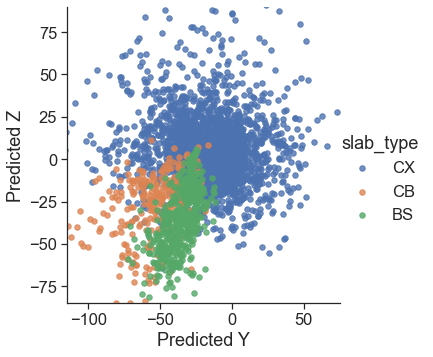

In [302]:
sns.lmplot(x='predicted_y', y='predicted_z', hue = 'slab_type', 
           data=preds_df, 
           fit_reg=False, scatter_kws={"s": 30})
plt.xlabel('Predicted Y')
plt.ylabel('Predicted Z')
plt.ylim(-85,90)
plt.xlim(-115,75)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain_plot_YZ_pred.pdf',
#            bbox_inches='tight')

In [303]:
preds_df.loc[:,'BD2'] = bd2

(-115.0, 75.0)

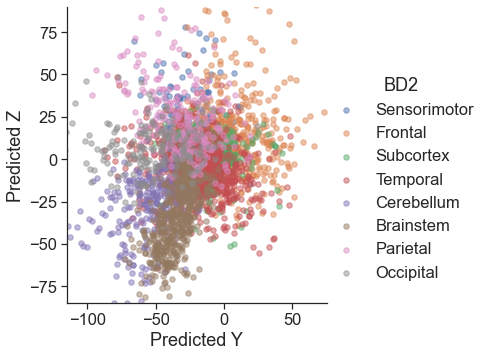

In [304]:
sns.lmplot(x='predicted_y', y='predicted_z', hue = 'BD2', data=preds_df, 
           fit_reg=False, 
           scatter_kws={"s": 30,'alpha':0.5})
plt.xlabel('Predicted Y')
plt.ylabel('Predicted Z')
plt.ylim(-85,90)
plt.xlim(-115,75)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain_plot_YZ_pred_div.pdf',
#            bbox_inches='tight')

In [305]:
# is extremity or distance from center related to error?

# extremity
from scipy.spatial.distance import cdist
distmat = cdist(full_y.round(4).values,full_y.round(4).values)
dm = pandas.DataFrame(distmat)

preds_df.loc[:,'extremity'] = dm.mean(1).values

# distance from center
preds_df.loc[:,'abs_mni_nlin_y'] = preds_df.mni_nlin_y.abs().values
preds_df.loc[:,'abs_mni_nlin_z'] = preds_df.mni_nlin_z.abs().values
preds_df.loc[:,'center_dist'] = preds_df[['abs_mni_nlin_x','abs_mni_nlin_y',
                               'abs_mni_nlin_z']].mean(1).values

In [306]:
preds_df.loc[:,'error_y'] = abs(preds_df.predicted_y.values -\
                                preds_df.mni_nlin_y.values)
preds_df.loc[:,'error_z'] = abs(preds_df.predicted_z.values -\
                                preds_df.mni_nlin_z.values)
preds_df.loc[:,'error_x'] = abs(preds_df.predicted_x.values -\
                                preds_df.abs_mni_nlin_x.values)
preds_df.loc[:,'total_error'] = preds_df[['error_y',
                                          'error_z',
                                          'error_x']].mean(1).values

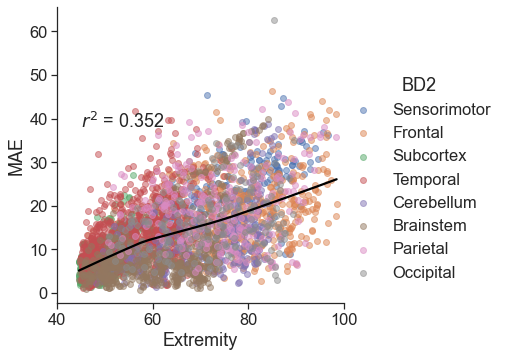

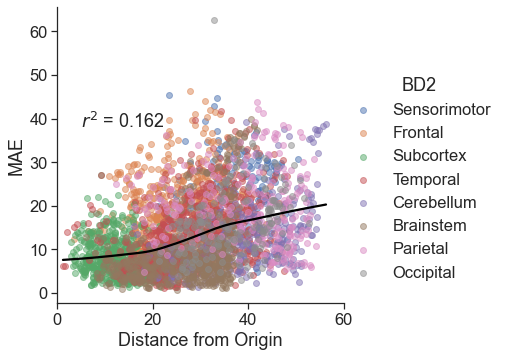

In [307]:
r2 = stats.pearsonr(preds_df.extremity,preds_df.total_error)[0]**2
sns.lmplot(x='extremity',y='total_error',data=preds_df,
          fit_reg=False,hue='BD2',scatter_kws={'alpha':0.5})
sns.regplot(x='extremity',y='total_error',data=preds_df,
          color='black',marker='',lowess=True)
plt.xlabel('Extremity')
plt.ylabel('MAE')
plt.xlim(40,100)
plt.text(45,38,'$r^{2}$ = %s'%round(r2,3))
# plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/ErrVExtremity.pdf',
#            bbox_inches='tight')
plt.show()

r2 = stats.pearsonr(preds_df.center_dist,preds_df.total_error)[0]**2
sns.lmplot(x='center_dist',y='total_error',data=preds_df, 
          fit_reg=False,hue='BD2',scatter_kws={'alpha':0.5})
sns.regplot(x='center_dist',y='total_error',data=preds_df,
         lowess=True,color='black',marker='')
plt.xlabel('Distance from Origin')
plt.ylabel('MAE')
plt.xlim(0,60)
plt.text(5,38,'$r^{2}$ = %s'%round(r2,3))
# plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/ErrVCenterDist.pdf',
#            bbox_inches='tight')
plt.show()

# sns.lmplot(x='abs_mni_nlin_x',y='error_x',data=preds_df, 
#           fit_reg=False,hue='BD2',scatter_kws={'alpha':0.5})
# sns.regplot(x='abs_mni_nlin_x',y='error_x',data=preds_df,
#           lowess=True,color='black',marker='')
# plt.show()

# sns.lmplot(x='abs_mni_nlin_y',y='error_y',data=preds_df, 
#           fit_reg=False,hue='BD2',scatter_kws={'alpha':0.5})
# sns.regplot(x='abs_mni_nlin_y',y='error_y',data=preds_df,
#           lowess=True,color='black',marker='')
# plt.show()

# sns.lmplot(x='abs_mni_nlin_z',y='error_z',data=preds_df, 
#           fit_reg=False,hue='BD2',scatter_kws={'alpha':0.5})
# sns.regplot(x='abs_mni_nlin_z',y='error_z',data=preds_df,
#           lowess=True,color='black',marker='')
# plt.show()

In [308]:
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(pca_tfm, full_y)
y_input = pandas.DataFrame(full_y.values)
bsrx, bsry, allx_bs, ally_bs = XD.bootstrap_features(PLSRegression(n_components=3), 
                                                  pls_mod, 
                                                  pca_tfm, 
                                                  y_input, 
                                                  n_iterations=1000)

finished iteration 0
finished iteration 100
finished iteration 200
finished iteration 300
finished iteration 400
finished iteration 500
finished iteration 600
finished iteration 700
finished iteration 800
finished iteration 900


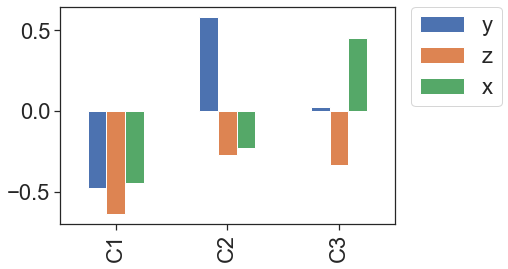

In [309]:
sns.set_context('notebook',font_scale=2)
g = pandas.DataFrame(pls_mod.y_weights_, 
                 index=['y','z','x'],
                 columns=['component %s'%x for x in range(3)]).T.plot.bar()
g.set_xticklabels(['C1','C2','C3'])
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/y_weights.pdf',
#             bbox_inches='tight')

[Text(0, 0, ''),
 Text(1, 0, ''),
 Text(2, 0, ''),
 Text(3, 0, ''),
 Text(4, 0, ''),
 Text(5, 0, ''),
 Text(6, 0, ''),
 Text(7, 0, ''),
 Text(8, 0, ''),
 Text(9, 0, ''),
 Text(10, 0, ''),
 Text(11, 0, ''),
 Text(12, 0, ''),
 Text(13, 0, ''),
 Text(14, 0, ''),
 Text(15, 0, ''),
 Text(16, 0, ''),
 Text(17, 0, ''),
 Text(18, 0, ''),
 Text(19, 0, ''),
 Text(20, 0, ''),
 Text(21, 0, ''),
 Text(22, 0, ''),
 Text(23, 0, ''),
 Text(24, 0, ''),
 Text(25, 0, ''),
 Text(26, 0, ''),
 Text(27, 0, ''),
 Text(28, 0, ''),
 Text(29, 0, ''),
 Text(30, 0, ''),
 Text(31, 0, ''),
 Text(32, 0, ''),
 Text(33, 0, ''),
 Text(34, 0, ''),
 Text(35, 0, ''),
 Text(36, 0, ''),
 Text(37, 0, ''),
 Text(38, 0, ''),
 Text(39, 0, ''),
 Text(40, 0, ''),
 Text(41, 0, ''),
 Text(42, 0, ''),
 Text(43, 0, ''),
 Text(44, 0, ''),
 Text(45, 0, ''),
 Text(46, 0, ''),
 Text(47, 0, ''),
 Text(48, 0, ''),
 Text(49, 0, ''),
 Text(50, 0, ''),
 Text(51, 0, ''),
 Text(52, 0, ''),
 Text(53, 0, ''),
 Text(54, 0, ''),
 Text(55, 0, ''),
 T

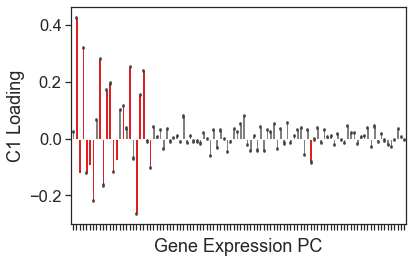

In [310]:
plotr = pandas.concat([pandas.Series(allx_bs[0].values.flatten()),
                       #pandas.Series(list(range(100))*500)],
                       pandas.Series(list(range(100))*1000)],
                      axis=1)
plotr.columns = ['Loading','Component']

sns.set(font_scale=1.5)
sns.set_style('ticks')
colors = ['Red' if x else 'Grey' for x in multipletests(bsrx['p'].loc[0], method='fdr_bh')[0]]
g=sns.barplot(x='Component', y='Loading', data=plotr, palette=colors)
plt.xlabel('Gene Expression PC')
plt.ylabel('C1 Loading')
g.set_xticklabels([None for x in range(100)])

In [ ]:
# sigs = multipletests(bsrx['p'].loc[0], method='fdr_bh')[0]
# new_loading = [pls_mod.x_loadings_[x,0] if sigs[x] else 0 for x in range(pca_tfm.shape[-1])]
# newc1 = np.dot(pcamod.components_.T, new_loading)
# newc1 = pandas.concat([pandas.Series(newc1), pandas.Series(bigdf.columns)],
#                       axis=1)

# Projection

In [270]:
g2.columns

Index(['Unnamed: 0.1', 'donor', 'sample', 'structure_id', 'slab_num',
       'well_id', 'slab_type', 'structure_acronym', 'structure_name',
       'polygon_id', 'mri_voxel_x', 'mri_voxel_y', 'mri_voxel_z', 'mni_x',
       'mni_y', 'mni_z', 'A-P_axis_gxp_signature_similarity_SPCR',
       'A-P_axis_gxp_signature_similarity_LARS',
       'a20_LARS_avg_gene_expression', 'a20_SPCR_avg_gene_expression',
       'a500_SPCR_avg_gene_expression', 'mixed_test_a20_avg_gene_expression',
       'mixed_test_p20_avg_gene_expression', 'p20_LARS_avg_gene_expression',
       'p20_SPCR_avg_gene_expression', 'p500_SPCR_avg_gene_expression',
       'p50_SPCR_avg_gene_expression', 'gabe_label', 'mni_nlin_x',
       'mni_nlin_y', 'mni_nlin_z', 'new_structure_acronym', 'abs_mni_nlin_x',
       'brain_divison', 'Neural_Tube_segment', 'Sensory_Type', 'Cortical_Type',
       'Component1_Expresion', 'Component2_Expresion', 'Component3_Expresion',
       'bilateral_structure_name', 'GMcov_mean', 'GM_mean', 'BD2'],

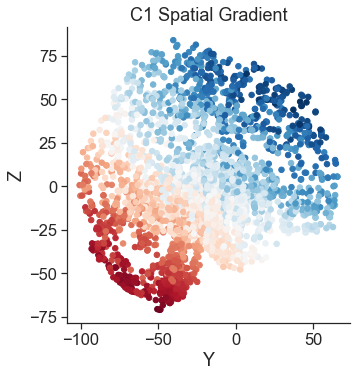

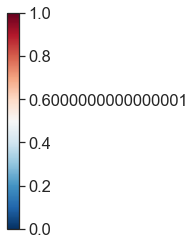

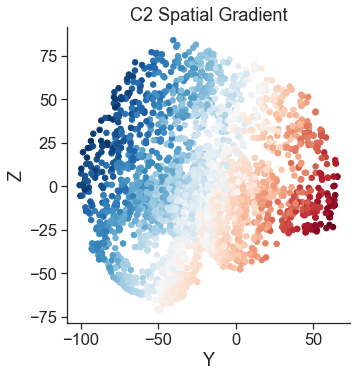

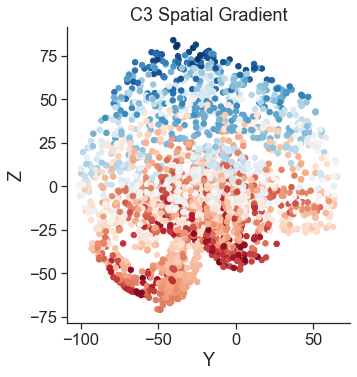

In [311]:
from sklearn.preprocessing import MinMaxScaler
from matplotlib.colors import Normalize

cmap = sns.color_palette('RdBu_r',as_cmap=True)

for i in range(pls_mod.y_weights_.shape[0]):
    #sg = np.dot(full_y.values,pls_mod.y_weights_[i,:])
    sg = np.dot(full_y.values,pls_mod.y_weights_[:,i])
    scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
    g2.loc[:,'C%s_SmoothGradient'%(i+1)] = sg
    norm = Normalize(vmin=np.min(scaled_sg), 
                                       vmax=np.max(scaled_sg))
    cscale = cmap(norm(scaled_sg))

    g = sns.lmplot(x='mni_nlin_y', y='mni_nlin_z',  
                   data=g2, fit_reg=False, #aspect=2,
                   scatter_kws={"s": 30,'color':cscale},
                  palette='RdBu_r')
    
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.title('C%s Spatial Gradient'%(i+1))
    #plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
#     plt.ylim(-85,90)
#     plt.xlim(-115,75)
#     plt.xticks([-100,-50,0,50])
#     plt.yticks(list(range(-75,76,25)))
#     plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/brain_plot_SpatialC%s_YZ.pdf'%(i+1),
#                bbox_inches='tight')

    if i == 0:
    # colorbar
        a = np.array([[0,1]])
        #a = np.linspace(0,1,10)
        plt.figure(figsize=(.2, 5))
        img = plt.imshow(a, cmap="RdBu_r")
        plt.gca().set_visible(False)
        cax = plt.axes([0.1, 0.2, 0.8, 0.6])
        cbar = plt.colorbar(orientation="vertical", cax=cax)
        #newticks = [int(round(norm.inverse(x))) for x in cbar.get_ticks()]
        newticks = [norm.inverse(x) for x in cbar.get_ticks()]
        cbar.set_ticks(cbar.get_ticks())
        cbar.set_ticklabels(newticks)
#         plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/brain_plot_component_cbar.pdf',
#                    bbox_inches='tight')

        plt.show()




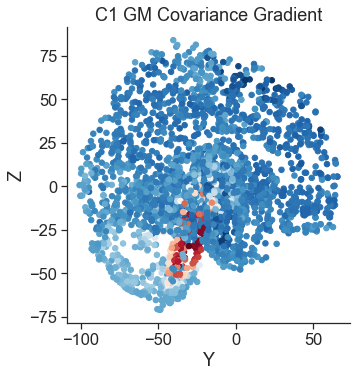

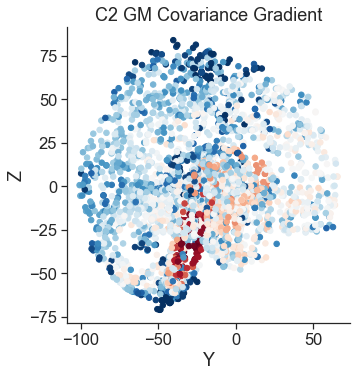

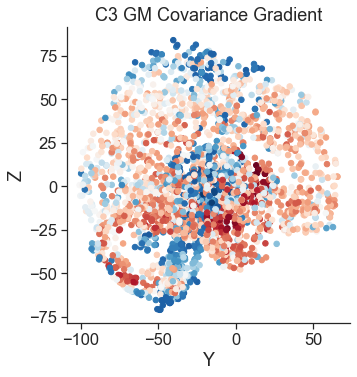

In [315]:
from sklearn.preprocessing import MinMaxScaler

cmap = sns.color_palette('RdBu_r',as_cmap=True)

for i in range(pls_mod.y_weights_.shape[0]):
    #if i == 2:
    sg = np.dot(pca_tfm.values,pls_mod.x_weights_[:,i])
    #else:
    #    sg = -gdf.loc[:,'Component%s_Expresion'%(i+1)].values
    scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
    norm = Normalize(vmin=np.min(scaled_sg), 
                                       vmax=np.max(scaled_sg))
    cscale = cmap(norm(scaled_sg))

    g = sns.lmplot(x='mni_nlin_y', y='mni_nlin_z',# aspect=2, 
                   data=g2, fit_reg=False, 
                   scatter_kws={"s": 30,'color':cscale},
                  palette='RdBu_r')
    
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.title('C%s GM Covariance Gradient'%(i+1))
    #plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
#     plt.ylim(-85,90)
#     plt.xlim(-115,75)
#     plt.xticks([-100,-50,0,50])
#     plt.yticks(list(range(-75,76,25)))
#     plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/brain_plot_GenomicC%s_YZ.pdf'%(i+1),
#                bbox_inches='tight')



<AxesSubplot:>

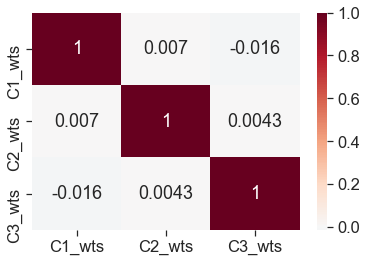

In [316]:
wmat = pandas.DataFrame(np.corrcoef(pls_mod.x_weights_.T),
                       index=['C1_wts','C2_wts','C3_wts'],
                       columns=['C1_wts','C2_wts','C3_wts'])
sns.heatmap(wmat,cmap='RdBu_r',center=0,annot=True)

# Sub-specific analyses

#### First with the crappier model using subject data

In [ ]:
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(pca_tfm, full_y)

In [ ]:
compwts = pandas.DataFrame()
for i in range(3):
    sigs = multipletests(bsrx['p'].loc[i], method='fdr_bh')[0]
    new_loading = [pls_mod.x_loadings_[x,i] if sigs[x] else 0 for x in range(pca_tfm.shape[-1])]
    compwts.loc[:,'C%s_X'%(i+1)] = np.dot(pcamod.components_.T, new_loading)
    #compwts.loc[:,'C%s_Y'%(i+1)] = np.dot(pcamod.components_.T, pls_mod.y_loadings_[:,i])


In [17]:
demo = pandas.read_csv('/Users/jacobv/Science/PLS_GXP/PNC/n1601_demographics_go1_20161212.csv')
demo.index = demo.scanid.values
compwts.loc[:,'age'] = demo.loc[alldat.index,'ageAtScan1'].values

NameError: name 'compwts' is not defined

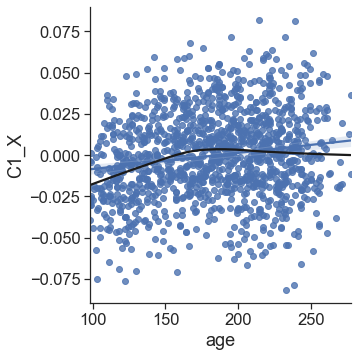

r = 0.156, p = 0.0


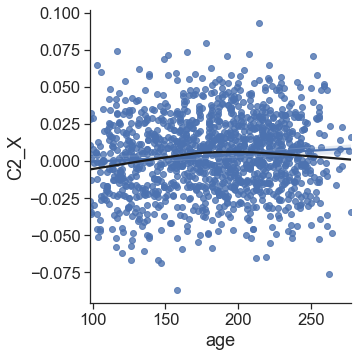

r = 0.081, p = 0.004


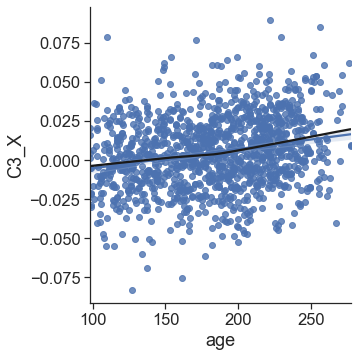

r = 0.223, p = 0.0


In [342]:
for i in range(1,4):
    sns.lmplot(x='age',y='C%s_X'%i,data=compwts)
    sns.regplot(x='age',y='C%s_X'%i,data=compwts,lowess=True,marker='',
           scatter_kws={'ls':'--'},color='k')
    plt.show()
    r,p = stats.pearsonr(compwts.age.values,compwts['C%s_X'%i].values)
    print('r = %s, p = %s'%(round(r,3),round(p,3)))

#### Now with the original model using brainwide covariance data

In [343]:
pcamod = PCA(n_components=100, random_state=123).fit(cmat)
pca_tfm = pandas.DataFrame(pcamod.transform(cmat))
pls_mod = PLSRegression(n_components=3)
full_y = g2[['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
pls_mod.fit(pca_tfm, full_y)

PLSRegression(n_components=3)

In [344]:
pca_tfm.shape

(3465, 100)

In [345]:
bsrx, bsry, allx_bs, ally_bs = XD.bootstrap_features(PLSRegression(n_components=3), 
                                                  pls_mod, 
                                                  pca_tfm, 
                                                  y_input, 
                                                  n_iterations=1000)

finished iteration 0
finished iteration 100
finished iteration 200
finished iteration 300
finished iteration 400
finished iteration 500
finished iteration 600
finished iteration 700
finished iteration 800
finished iteration 900


In [346]:
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(pca_tfm, full_y)

PLSRegression(n_components=3)

In [385]:
compwts = pandas.DataFrame(index = alldat.columns)
for i in range(3):
    sigs = multipletests(bsrx['p'].loc[i], method='fdr_bh')[0]
    new_loading = [pls_mod.x_loadings_[x,i] if sigs[x] else 0 for x in range(pca_tfm.shape[-1])]
    compwts.loc[:,'C%s_X'%(i+1)] = np.dot(pcamod.components_.T, new_loading)
    #compwts.loc[:,'C%s_Y'%(i+1)] = np.dot(pcamod.components_.T, pls_mod.y_loadings_[:,i])


In [386]:
for i in range(1,4):
    demo.loc[alldat.index,'C%s_GMCV'%i] =  np.dot(alldat,
                                                  compwts['C%s_X'%i])

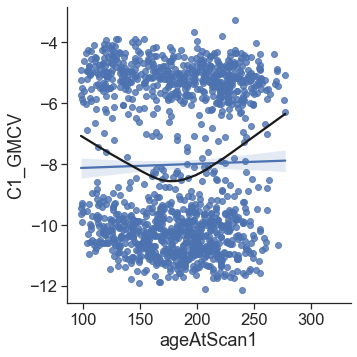

r = 0.022, p = 0.437


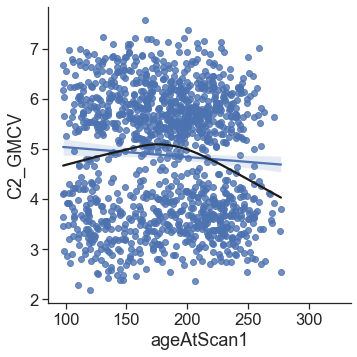

r = -0.066, p = 0.018


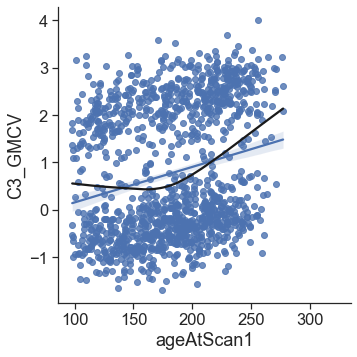

r = 0.229, p = 0.0


In [387]:
for col in demo.columns[-3:]:
    sns.lmplot(x='ageAtScan1',y=col,data=demo)
    sns.regplot(x='ageAtScan1',y=col,data=demo,lowess=True,marker='',
           scatter_kws={'ls':'--'},color='k')
    plt.show()
    r,p = stats.pearsonr(demo.loc[alldat.index,'ageAtScan1'].values,
                         demo.loc[alldat.index,col].values)
    print('r = %s, p = %s'%(round(r,3),round(p,3)))

In [390]:
#sortr = compwts.sort_values('C1_X').index

In [417]:
# list(zip(compwts.loc[sortr,'C1_X'].round(3),
#          alldat.loc[6665,sortr.astype(str)].round(3),
#          alldat.loc[7910,sortr.astype(str)].round(3)))

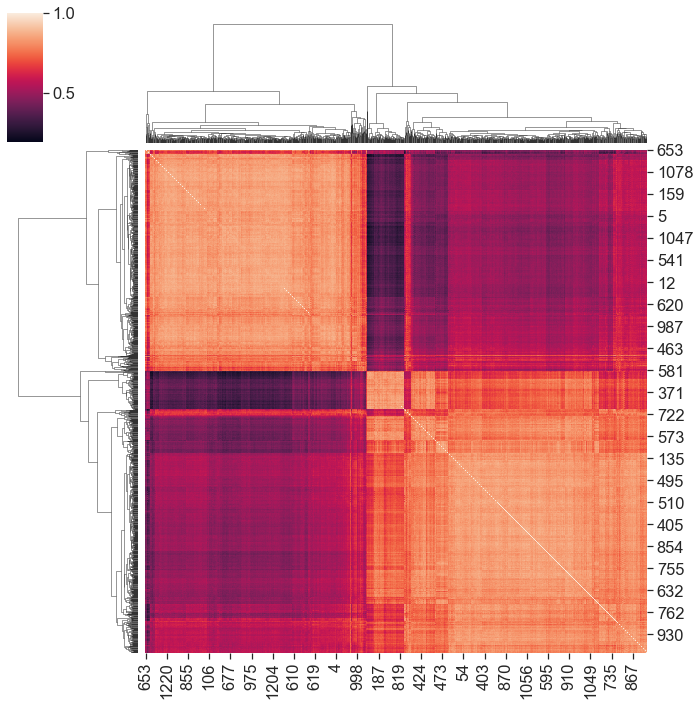

In [396]:
sns.clustermap(np.corrcoef(alldat))

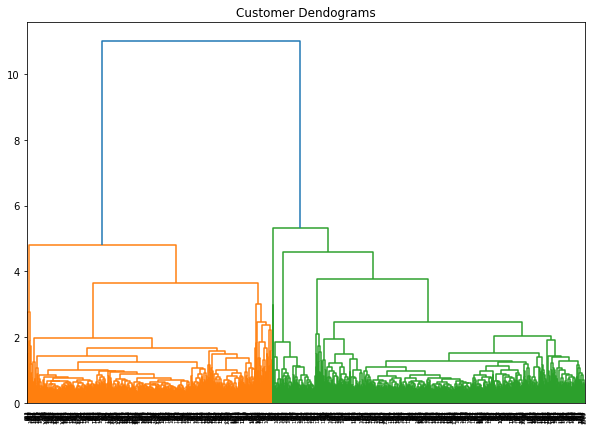

In [14]:
import scipy.cluster.hierarchy as shc
from matplotlib import pyplot as plt
plt.figure(figsize=(10, 7))
plt.title("Customer Dendograms")
linkCov = shc.linkage(np.corrcoef(alldat), method='average',
                                  metric='euclidean'
                                 )
dend = shc.dendrogram(linkCov)
plt.show()

In [15]:
from scipy.cluster.hierarchy import fcluster
max_d = 8
sub_clusters = fcluster(linkCov, max_d, criterion='distance')
sub_clusters

array([1, 1, 1, ..., 1, 1, 2], dtype=int32)

In [18]:
demo.loc[alldat.index,'GMCov_Clusters'] = sub_clusters

In [23]:
demo.to_csv('/Users/jacobv/Science/PLS_GXP/PNC/GMDCov_Clusters.csv')

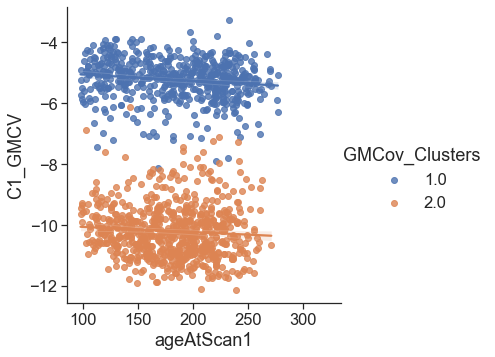

CLUSTER 1: r = -0.14, p = 0.001
CLUSTER 2: r = -0.075, p = 0.048


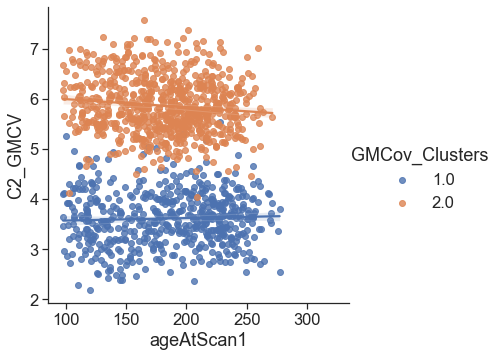

CLUSTER 1: r = 0.041, p = 0.33
CLUSTER 2: r = -0.111, p = 0.003


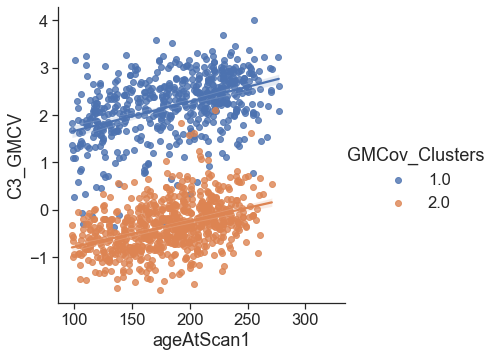

CLUSTER 1: r = 0.424, p = 0.0
CLUSTER 2: r = 0.409, p = 0.0


In [426]:
for col in ['C1_GMCV', 'C2_GMCV', 'C3_GMCV',]:
    sns.lmplot(x='ageAtScan1',y=col,data=demo,hue='GMCov_Clusters')
    #sns.regplot(x='ageAtScan1',y=col,data=demo,lowess=True,marker='',
    #       scatter_kws={'ls':'--'},color='k',hue='GMCov_Clusters')
    plt.show()
    for gmc in np.unique(sub_clusters):
        r,p = stats.pearsonr(demo.loc[demo.GMCov_Clusters==gmc,
                                      'ageAtScan1'].values,
                             demo.loc[demo.GMCov_Clusters==gmc,
                                      col].values)
        print('CLUSTER %s: r = %s, p = %s'%(gmc,round(r,3),round(p,3)))

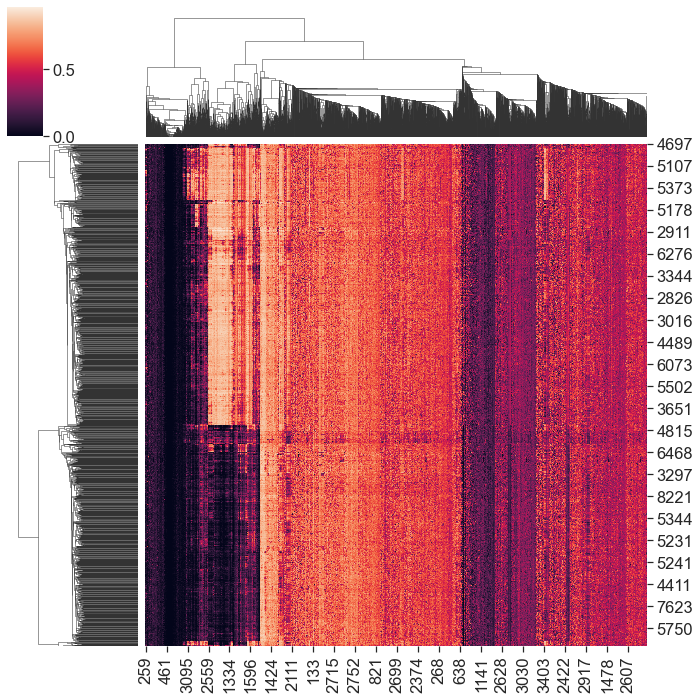

In [401]:
sns.clustermap(alldat)

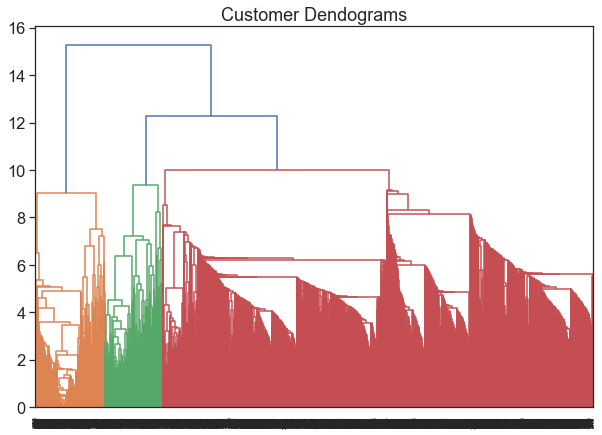

In [404]:
plt.figure(figsize=(10, 7))
plt.title("Customer Dendograms")
linksub = shc.linkage(alldat.T, method='average',
                                  metric='euclidean'
                                 )
dend = shc.dendrogram(linksub)
plt.show()

In [407]:
from scipy.cluster.hierarchy import fcluster
max_d = 11
reg_clusters = fcluster(linksub, max_d, criterion='distance')
reg_clusters

array([3, 3, 1, ..., 3, 3, 1], dtype=int32)

In [411]:
g2.loc[:,'varianceCluster'] = reg_clusters

In [416]:
g2.varianceCluster.value_counts()

3    2673
1     435
2     357
Name: varianceCluster, dtype: int64

In [415]:
pandas.crosstab(index=g2.brain_divison,columns=g2.varianceCluster)

varianceCluster,1,2,3
brain_divison,,,
Anterior_Cingulate,2,0,97
Cerebellum,19,0,237
DCN,15,0,14
Forebrain,6,3,38
Frontal,19,2,384
Hypothalamus,15,15,39
Insula,9,0,82
Limbic,21,1,247
Medulla,52,65,127


So it looks like this variation is being caused by a systematic difference in Brainstem/Midbrain/Subcortical nuclei

# Original Tx components
Why not have a look at doing this same thing, but with the original genetic components?

In [433]:
gcomps = pandas.read_csv('/Users/jacobv/Science/PLS_GXP/PNC/Genomic_Component_Expression.csv',
                        index_col=0)
gcomps = gcomps.loc[g2.index]
gcomps.head()

,C1,C2,C3
2756,-10.388117,-6.245429,0.299781
2757,-3.180518,1.292643,-5.820168
2758,2.421407,3.771899,-2.319940
2759,12.404096,5.505124,6.897475
2760,7.409901,6.098659,1.425327


In [435]:
for i in range(1,4):
    demo.loc[alldat.index,'C%s_Tx'%i] =  np.dot(alldat,
                                                  gcomps['C%s'%i])

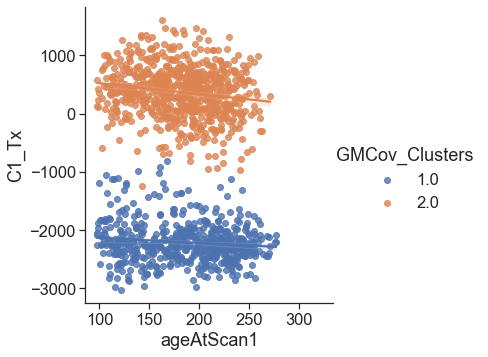

CLUSTER 1: r = -0.115, p = 0.007
CLUSTER 2: r = -0.165, p = 0.0


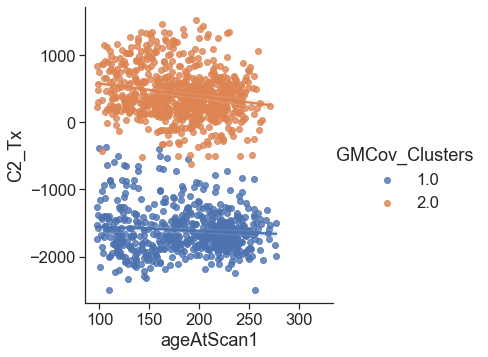

CLUSTER 1: r = -0.079, p = 0.062
CLUSTER 2: r = -0.195, p = 0.0


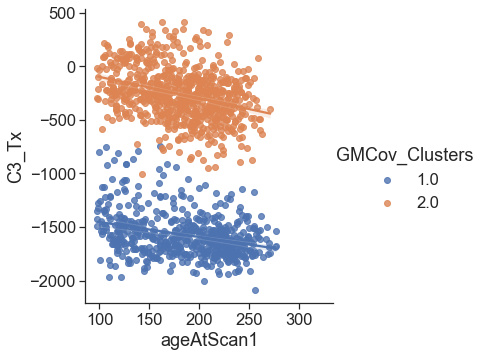

CLUSTER 1: r = -0.309, p = 0.0
CLUSTER 2: r = -0.322, p = 0.0


In [437]:
for col in ['C1_Tx', 'C2_Tx', 'C3_Tx']:
    sns.lmplot(x='ageAtScan1',y=col,data=demo,hue='GMCov_Clusters')
    #sns.regplot(x='ageAtScan1',y=col,data=demo,lowess=True,marker='',
    #       scatter_kws={'ls':'--'},color='k',hue='GMCov_Clusters')
    plt.show()
    for gmc in np.unique(sub_clusters):
        r,p = stats.pearsonr(demo.loc[demo.GMCov_Clusters==gmc,
                                      'ageAtScan1'].values,
                             demo.loc[demo.GMCov_Clusters==gmc,
                                      col].values)
        print('CLUSTER %s: r = %s, p = %s'%(gmc,round(r,3),round(p,3)))

# Major conclusions
* There is a systematic issue with PNC GMD data that's reflected in the classification of non-cortex structures
* The spatial gradient of structural covariance is highly consistent with the spatial gradient of genomic covariance. This may just be a reflection of brain space
* With older age, GM is getting denser in cortex regions as opposed to non-association cortex regions

# Quick trial with glasser parcellation

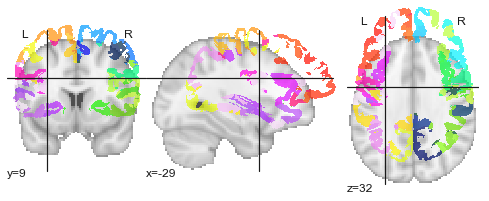

In [236]:
plotting.plot_roi('/Users/jacobv/Science/PLS_GXP/PNC/pncTemplateGlasser_Labels.nii.gz')

Only cortical. Typical.

In [237]:
g_coords = plotting.find_parcellation_cut_coords('/Users/jacobv/Science/PLS_GXP/PNC/pncTemplateGlasser_Labels.nii.gz')

In [242]:
g_coords = pandas.DataFrame(g_coords,columns = ['x','y','z'])
g_coords.loc[:,'abs_x'] = g_coords.x.abs().values

In [246]:
glasr = pandas.read_csv('/Users/jacobv/Science/PLS_GXP/PNC/n1601_glasserGMDMultiLabel_20161220.csv')
glasr.index = glasr.scanid.values
glasr.loc[goodscans]

In [ ]:
glasr

In [245]:
len(shared)

0

,bblid,scanid,mprage_glasser_gmd_Right_V1,mprage_glasser_gmd_Right_MST,mprage_glasser_gmd_Right_V6,mprage_glasser_gmd_Right_V2,mprage_glasser_gmd_Right_V3,mprage_glasser_gmd_Right_V4,mprage_glasser_gmd_Right_V8,mprage_glasser_gmd_Right_4,...,mprage_glasser_gmd_Left_p47r,mprage_glasser_gmd_Left_TGv,mprage_glasser_gmd_Left_MBelt,mprage_glasser_gmd_Left_LBelt,mprage_glasser_gmd_Left_A4,mprage_glasser_gmd_Left_STSva,mprage_glasser_gmd_Left_TE1m,mprage_glasser_gmd_Left_PI,mprage_glasser_gmd_Left_a32pr,mprage_glasser_gmd_Left_p24
2632,80961,2632,0.442066,0.523180,0.556975,0.518561,0.555272,0.577185,0.723984,0.570602,...,0.600231,0.633262,0.624652,0.761396,0.663489,0.794834,0.617017,0.712084,0.722730,0.665653
2637,80199,2637,0.444217,0.807102,0.606915,0.468396,0.566780,0.581329,0.711988,0.606289,...,0.560482,0.621298,0.701652,0.748429,0.661166,0.810743,0.615595,0.813079,0.729294,0.670106
2644,81005,2644,0.406437,0.544295,0.540034,0.436639,0.489815,0.512656,0.684100,0.468010,...,0.603641,0.572843,0.626414,0.821348,0.643465,0.811532,0.691198,0.730943,0.778814,0.725209
2646,80812,2646,0.509276,0.737520,0.633858,0.527423,0.608979,0.614764,0.660480,0.657557,...,0.591668,0.596663,0.691136,0.745324,0.628666,0.622364,0.721734,0.733079,0.730434,0.683868
2647,80607,2647,0.462814,0.585271,0.654039,0.506784,0.576718,0.699642,0.765021,0.568301,...,0.642868,0.642286,0.655200,0.696656,0.631084,0.852849,0.712436,0.749673,0.778042,0.649708
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8457,113492,8457,0.606967,0.738006,0.661535,0.584943,0.596335,0.659949,0.721574,0.646005,...,0.712734,0.621109,0.705676,0.615516,0.677429,0.789703,0.627447,0.705552,0.748311,0.708502
8464,114672,8464,0.476035,0.743687,0.640078,0.532217,0.574137,0.657758,0.699307,0.650982,...,0.627605,0.637240,0.708575,0.742005,0.678084,0.799680,0.715222,0.698235,0.757905,0.752314
8465,139100,8465,0.464460,0.493562,0.588525,0.541937,0.606518,0.628266,0.669363,0.668717,...,0.577260,0.620207,0.719335,0.780700,0.687987,0.695969,0.643077,0.668654,0.695889,0.683685
8469,129191,8469,0.498658,0.735775,0.608989,0.564918,0.603133,0.653896,0.668897,0.660358,...,0.518978,0.576816,0.577388,0.729219,0.688582,0.685801,0.679861,0.708926,0.758513,0.698992
